In [1]:
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
# ---- Paths (update to your actual TSV paths) ----
fc_path = "/Users/ujjwalsamanta/Desktop/HOMEWORK/PhDMUSC/MUSC/Sem2/LabRotation/combined_df_withinbetween_fcrsn7_artifact_pfactor_filter_harmonized.tsv"
gv_path = "/Users/ujjwalsamanta/Desktop/HOMEWORK/PhDMUSC/MUSC/Sem2/LabRotation/combined_df_gv_artifact_pfactor_filter_harmonized.tsv"
sa_path = "/Users/ujjwalsamanta/Desktop/HOMEWORK/PhDMUSC/MUSC/Sem2/LabRotation/combined_df_sa_artifact_pfactor_filter_harmonized.tsv"


df_fc = pd.read_csv(fc_path, sep="\t")
df_gv = pd.read_csv(gv_path, sep="\t")
df_sa = pd.read_csv(sa_path, sep="\t")

print(df_fc.shape, df_gv.shape, df_sa.shape)
print(df_fc.columns[:10])

/var/folders/6s/hdwy5qm16y7grjqwnqg7blxh0000gn/T/ipykernel_81200/544047140.py:8: DtypeWarning: Columns (405) have mixed types. Specify dtype option on import or set low_memory=False.
  df_gv = pd.read_csv(gv_path, sep="\t")


(3847, 49) (4404, 423) (4404, 423)
Index(['Cont-Cont', 'Cont-Default', 'Cont-DorsAttn', 'Cont-Limbic',
       'Cont-SalVentAttn', 'Cont-SomMot', 'Cont-Vis', 'Default-Default',
       'Default-DorsAttn', 'Default-Limbic'],
      dtype='object')


/var/folders/6s/hdwy5qm16y7grjqwnqg7blxh0000gn/T/ipykernel_81200/544047140.py:9: DtypeWarning: Columns (405) have mixed types. Specify dtype option on import or set low_memory=False.
  df_sa = pd.read_csv(sa_path, sep="\t")


In [3]:
id_col = "participant_id"   # change if your file uses a different name
age_col = "age"             # change if it is named differently in your file

# quick sanity check
for name, d in [("FC", df_fc), ("GV", df_gv), ("SA", df_sa)]:
    print(name, "has id?", id_col in d.columns, "has age?", age_col in d.columns)

FC has id? True has age? True
GV has id? True has age? True
SA has id? True has age? True


In [4]:
# FC columns (same rule you used)
fc_cols = [c for c in df_fc.columns if "-" in c]

# Structural ROI columns (same rule you used)
gv_cols = [c for c in df_gv.columns if c.startswith("7Networks_")]
sa_cols = [c for c in df_sa.columns if c.startswith("7Networks_")]

print("FC features:", len(fc_cols))
print("GV features:", len(gv_cols))
print("SA features:", len(sa_cols))

FC features: 28
GV features: 400
SA features: 400


In [5]:
# Keep only needed columns
df_fc_min = df_fc[[id_col, age_col] + fc_cols].copy()
df_gv_min = df_gv[[id_col, age_col] + gv_cols].copy()
df_sa_min = df_sa[[id_col, age_col] + sa_cols].copy()

# Merge: FC + GV + SA
df_all = df_fc_min.merge(df_gv_min, on=[id_col, age_col], how="inner") \
                  .merge(df_sa_min, on=[id_col, age_col], how="inner")

print("Merged shape:", df_all.shape)
df_all.head()

Merged shape: (3762, 830)


,participant_id,age,Cont-Cont,Cont-Default,Cont-DorsAttn,Cont-Limbic,Cont-SalVentAttn,Cont-SomMot,Cont-Vis,Default-Default,...,7Networks_RH_Default_PFCdPFCm_13_y,7Networks_RH_Default_pCunPCC_1_y,7Networks_RH_Default_pCunPCC_2_y,7Networks_RH_Default_pCunPCC_3_y,7Networks_RH_Default_pCunPCC_4_y,7Networks_RH_Default_pCunPCC_5_y,7Networks_RH_Default_pCunPCC_6_y,7Networks_RH_Default_pCunPCC_7_y,7Networks_RH_Default_pCunPCC_8_y,7Networks_RH_Default_pCunPCC_9_y
0,1000393599,15.583333,0.211687,-0.018549,0.015364,-0.097971,0.009170,-0.219618,-0.064981,0.231939,...,475.274259,687.056131,131.104083,258.365647,458.058639,329.217044,470.086207,201.084758,226.372190,233.563201
1,1001970838,17.833333,0.139465,0.013661,-0.004232,0.005814,-0.072654,-0.138140,-0.020962,0.290917,...,506.000537,587.908277,114.736861,234.139804,324.767976,265.434544,337.607878,191.872779,207.993293,254.465109
2,1006151876,21.500000,0.105455,0.002971,0.045922,-0.026614,0.076109,0.018354,-0.069900,0.294200,...,414.737001,463.719722,91.779166,193.292122,354.515484,238.058189,311.684892,155.252085,201.368061,215.093890
3,1007995238,13.750000,0.120383,0.110645,-0.057715,-0.034357,0.015228,0.000757,-0.145574,0.334311,...,416.961200,531.831459,120.158141,198.755827,367.652956,280.514163,409.677427,236.587794,213.008182,246.137011
4,1011497669,16.666667,0.141770,-0.020864,0.033158,-0.045839,-0.062886,-0.081618,-0.075337,0.168888,...,311.958153,506.835500,131.383186,164.350771,443.677209,280.983274,533.910592,270.081934,271.851058,309.327438


In [6]:
df_all = df_all.dropna(axis=0)
print("After dropna:", df_all.shape)

y = df_all[age_col].values
X = df_all.drop(columns=[id_col, age_col]).values

print("X shape:", X.shape, "y shape:", y.shape)

After dropna: (3762, 830)
X shape: (3762, 828) y shape: (3762,)


### Comformal Interferance

In [7]:
# feature column rules
fc_cols = [c for c in df_fc.columns if "-" in c]
gv_cols = [c for c in df_gv.columns if c.startswith("7Networks_")]
sa_cols = [c for c in df_sa.columns if c.startswith("7Networks_")]

# rename structural columns to avoid overlap
df_gv_ren = df_gv.rename(columns={c: f"GV__{c}" for c in gv_cols})
df_sa_ren = df_sa.rename(columns={c: f"SA__{c}" for c in sa_cols})

# updated column lists after renaming
gv_cols_ren = [f"GV__{c}" for c in gv_cols]
sa_cols_ren = [f"SA__{c}" for c in sa_cols]

print("FC:", len(fc_cols), "GV:", len(gv_cols_ren), "SA:", len(sa_cols_ren))

FC: 28 GV: 400 SA: 400


In [8]:
df_fc_min = df_fc[[id_col, age_col] + fc_cols].copy()
df_gv_min = df_gv_ren[[id_col, age_col] + gv_cols_ren].copy()
df_sa_min = df_sa_ren[[id_col, age_col] + sa_cols_ren].copy()

df_master = (df_fc_min
             .merge(df_gv_min, on=[id_col, age_col], how="inner")
             .merge(df_sa_min, on=[id_col, age_col], how="inner")
            ).dropna(axis=0).reset_index(drop=True)

print("Master:", df_master.shape)

Master: (3762, 830)


In [9]:
df_fc_only = df_master[[id_col, age_col] + fc_cols].copy()
df_struct_only = df_master[[id_col, age_col] + gv_cols_ren + sa_cols_ren].copy()
df_combined = df_master[[id_col, age_col] + fc_cols + gv_cols_ren + sa_cols_ren].copy()

print("FC-only:", df_fc_only.shape)
print("Structural-only:", df_struct_only.shape)
print("Combined:", df_combined.shape)

FC-only: (3762, 30)
Structural-only: (3762, 802)
Combined: (3762, 830)


In [10]:
# Select FC features
fc_cols = [c for c in df_fc.columns if "-" in c]

# Keep only id, age, FC features
df_fc_only = df_fc[[id_col, age_col] + fc_cols].copy()

# Remove missing
df_fc_only = df_fc_only.dropna(axis=0)

print("Functional dataset shape:", df_fc_only.shape)

Functional dataset shape: (3847, 30)


In [11]:
y = df_fc_only[age_col].values
X = df_fc_only.drop(columns=[id_col, age_col]).values

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (3847, 28)
y shape: (3847,)


In [12]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.dummy import DummyRegressor
import numpy as np
import xgboost as xgb

def get_models():
    return {
        "Dummy": Pipeline([
            ("scaler", StandardScaler()),
            ("model", DummyRegressor())
        ]),
        
        "Ridge": Pipeline([
            ("scaler", StandardScaler()),
            ("model", RidgeCV(alphas=np.logspace(-3,3,30)))
        ]),
        
        "Lasso": Pipeline([
            ("scaler", StandardScaler()),
            ("model", LassoCV(alphas=np.logspace(-3,3,30), max_iter=5000))
        ]),
        
        "ElasticNet": Pipeline([
            ("scaler", StandardScaler()),
            ("model", ElasticNetCV(alphas=np.logspace(-3,3,30), l1_ratio=[.1,.5,.9], max_iter=5000))
        ]),
        
        "SVR": Pipeline([
            ("scaler", StandardScaler()),
            ("model", SVR(kernel="rbf"))
        ]),
        
        "RandomForest": RandomForestRegressor(
            n_estimators=200,
            random_state=42,
            n_jobs=-1
        ),
        
        "GradientBoosting": GradientBoostingRegressor(
            n_estimators=200,
            random_state=42
        ),
        
        "XGBoostQuantile": xgb.XGBRegressor(
            objective="reg:quantileerror",
            quantile_alpha=0.5,
            n_estimators=500,
            max_depth=5,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            reg_lambda=1.0,
            random_state=42,
            n_jobs=-1
        )
    }

## Fucntional with Conformal split

In [14]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

def split_conformal_regression(X, y, model, alpha=0.1, random_state=42):
    
    # 1️⃣ Split: Train / Temp
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=0.4, random_state=random_state
    )
    
    # 2️⃣ Split Temp into Calibration / Test
    X_cal, X_test, y_cal, y_test = train_test_split(
        X_temp, y_temp, test_size=0.5, random_state=random_state
    )

    # 3️⃣ Train model
    model.fit(X_train, y_train)

    # 4️⃣ Calibration residuals
    y_cal_pred = model.predict(X_cal)
    cal_res = np.abs(y_cal - y_cal_pred)

    # 5️⃣ Compute conformal quantile
    n = len(cal_res)
    k = int(np.ceil((n + 1) * (1 - alpha)))
    qhat = np.sort(cal_res)[min(k - 1, n - 1)]

    # 6️⃣ Predict test + intervals
    y_pred = model.predict(X_test)
    lower = y_pred - qhat
    upper = y_pred + qhat

    # 7️⃣ Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    coverage = np.mean((y_test >= lower) & (y_test <= upper))
    avg_width = np.mean(upper - lower)

    return {
        "rmse": rmse,
        "r2": r2,
        "coverage": coverage,
        "avg_width": avg_width,
        "qhat": qhat,
        "y_test": y_test,
        "y_pred": y_pred,
        "lower": lower,
        "upper": upper
    }

In [15]:
y = df_fc_only[age_col].values
X = df_fc_only.drop(columns=[id_col, age_col]).values

In [16]:
models = get_models()

results_all = []

for name, model in models.items():
    print(f"Running {name}...")
    
    out = split_conformal_regression(X, y, model, alpha=0.1)
    
    results_all.append({
        "Model": name,
        "RMSE": out["rmse"],
        "R2": out["r2"],
        "Coverage_90": out["coverage"],
        "Avg_Width_90": out["avg_width"]
    })

summary_fc = pd.DataFrame(results_all).sort_values("RMSE")
summary_fc

Running Dummy...
Running Ridge...
Running Lasso...
Running ElasticNet...
Running SVR...
Running RandomForest...
Running GradientBoosting...


,Model,RMSE,R2,Coverage_90,Avg_Width_90
4,SVR,3.277300,0.243399,0.888312,10.209959
2,Lasso,3.301333,0.232262,0.871429,9.992358
3,ElasticNet,3.304159,0.230947,0.872727,9.986415
1,Ridge,3.305292,0.230420,0.874026,9.995940
5,RandomForest,3.309353,0.228527,0.892208,10.529595
6,GradientBoosting,3.366495,0.201656,0.880519,10.368566
0,Dummy,3.767989,-0.000124,0.892208,11.300201


In [20]:
results_summary = []
results_full = {}   # <-- NEW dictionary to store full outputs

for name, model in models.items():
    print(f"Running {name}...")
    
    out = split_conformal_regression(X, y, model, alpha=0.1)
    
    # Store summary metrics
    results_summary.append({
        "Model": name,
        "RMSE": out["rmse"],
        "R2": out["r2"],
        "Coverage_90": out["coverage"],
        "Avg_Width_90": out["avg_width"]
    })
    
    # Store full output
    results_full[name] = out

summary_fc = pd.DataFrame(results_summary).sort_values("RMSE")
summary_fc

Running Dummy...
Running Ridge...
Running Lasso...
Running ElasticNet...
Running SVR...
Running RandomForest...
Running GradientBoosting...


,Model,RMSE,R2,Coverage_90,Avg_Width_90
4,SVR,3.277300,0.243399,0.888312,10.209959
2,Lasso,3.301333,0.232262,0.871429,9.992358
3,ElasticNet,3.304159,0.230947,0.872727,9.986415
1,Ridge,3.305292,0.230420,0.874026,9.995940
5,RandomForest,3.309353,0.228527,0.892208,10.529595
6,GradientBoosting,3.366495,0.201656,0.880519,10.368566
0,Dummy,3.767989,-0.000124,0.892208,11.300201


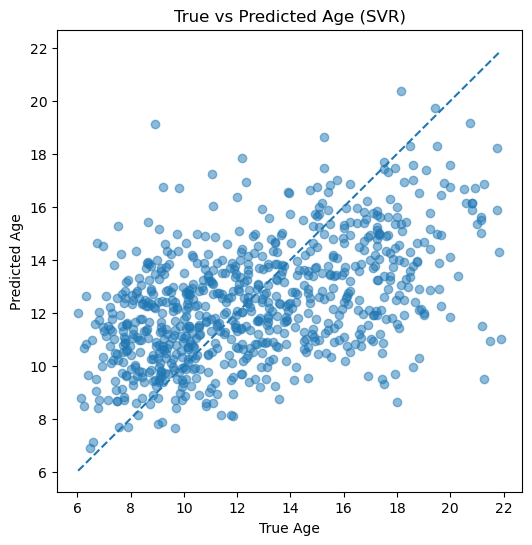

In [21]:
res = results_full["SVR"]
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.scatter(res["y_test"], res["y_pred"], alpha=0.5)

plt.plot([res["y_test"].min(), res["y_test"].max()],
         [res["y_test"].min(), res["y_test"].max()],
         linestyle="--")

plt.xlabel("True Age")
plt.ylabel("Predicted Age")
plt.title("True vs Predicted Age (SVR)")
plt.show()

In [22]:
best_model = summary_fc.iloc[0]["Model"]
best_model
res = results_full[best_model]   # results_full is the dict we created

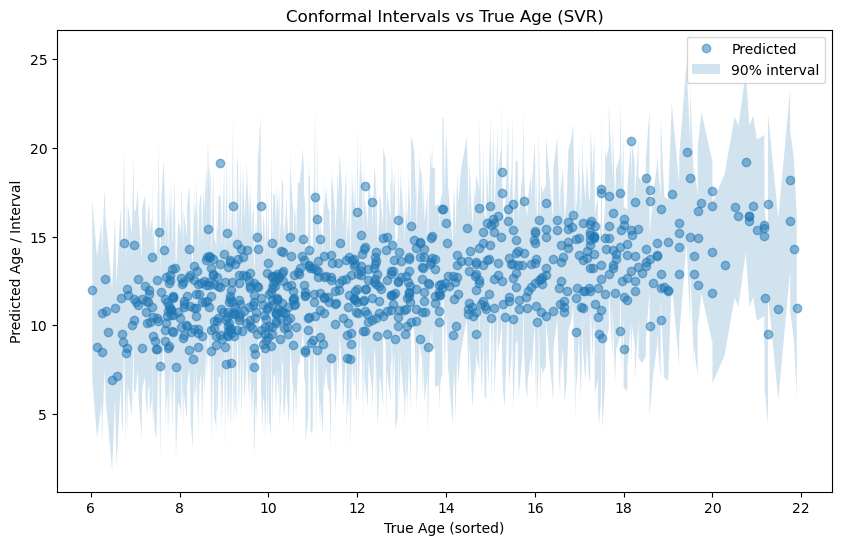

In [24]:
order = np.argsort(res["y_test"])

plt.figure(figsize=(10,6))
plt.plot(res["y_test"][order], res["y_pred"][order], marker="o", linestyle="", alpha=0.5, label="Predicted")
plt.fill_between(
    res["y_test"][order],
    res["lower"][order],
    res["upper"][order],
    alpha=0.2,
    label="90% interval"
)

plt.xlabel("True Age (sorted)")
plt.ylabel("Predicted Age / Interval")
plt.title(f"Conformal Intervals vs True Age ({best_model})")
plt.legend()
plt.show()

### Functional with CV+

In [13]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.dummy import DummyRegressor
import numpy as np
import xgboost as xgb

def get_models():
    return {
        "Dummy": Pipeline([
            ("scaler", StandardScaler()),
            ("model", DummyRegressor())
        ]),
        
        "Ridge": Pipeline([
            ("scaler", StandardScaler()),
            ("model", RidgeCV(alphas=np.logspace(-3,3,30)))
        ]),
        
        "Lasso": Pipeline([
            ("scaler", StandardScaler()),
            ("model", LassoCV(alphas=np.logspace(-3,3,30), max_iter=5000))
        ]),
        
        "ElasticNet": Pipeline([
            ("scaler", StandardScaler()),
            ("model", ElasticNetCV(alphas=np.logspace(-3,3,30), l1_ratio=[.1,.5,.9], max_iter=5000))
        ]),
        
        "SVR": Pipeline([
            ("scaler", StandardScaler()),
            ("model", SVR(kernel="rbf"))
        ]),
        
        "RandomForest": RandomForestRegressor(
            n_estimators=200,
            random_state=42,
            n_jobs=-1
        ),
        
        "GradientBoosting": GradientBoostingRegressor(
            n_estimators=200,
            random_state=42
        ),
        
        "XGBoostQuantile": xgb.XGBRegressor(
            objective="reg:quantileerror",
            quantile_alpha=0.5,
            n_estimators=500,
            max_depth=5,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            reg_lambda=1.0,
            random_state=42,
            n_jobs=-1
        )
    }

In [30]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.base import clone
from sklearn.metrics import mean_squared_error, r2_score

def cvplus_conformal_regression(
    X, y, model,
    alpha=0.1,
    n_splits=10,
    test_size=0.2,
    random_state=42
):
    # outer test split
    X_train_full, X_test, y_train_full, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

    fold_models = []
    fold_residuals = []

    for tr_idx, val_idx in kf.split(X_train_full):
        X_tr, y_tr = X_train_full[tr_idx], y_train_full[tr_idx]
        X_val, y_val = X_train_full[val_idx], y_train_full[val_idx]

        m = clone(model)
        m.fit(X_tr, y_tr)

        y_val_pred = m.predict(X_val)
        res = np.abs(y_val - y_val_pred)

        fold_models.append(m)
        fold_residuals.append(res)

    # point prediction on test (ensemble mean across folds)
    test_preds = np.column_stack([m.predict(X_test) for m in fold_models])
    y_pred = test_preds.mean(axis=1)

    # --- NEW: use CV residuals to compute one qhat like split conformal ---
    all_res = np.concatenate(fold_residuals)   # all out-of-fold absolute residuals

    n = len(all_res)
    k = int(np.ceil((n + 1) * (1 - alpha)))
    qhat = np.sort(all_res)[min(k - 1, n - 1)]

    lower = y_pred - qhat
    upper = y_pred + qhat

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    coverage = np.mean((y_test >= lower) & (y_test <= upper))
    avg_width = np.mean(upper - lower)

    return {
        "method": f"CV+ (K={n_splits})",
        "rmse": rmse,
        "r2": r2,
        "coverage": coverage,
        "avg_width": avg_width,
        "y_test": y_test,
        "y_pred": y_pred,
        "lower": lower,
        "upper": upper
    }

In [31]:
alpha = 0.1      # 90% intervals
K = 5
test_size = 0.2
seed = 42

results_summary_cvplus = []
results_full_cvplus = {}

for name, model in models.items():
    print(f"Running CV+ for {name}...")
    
    out = cvplus_conformal_regression(
        X, y,
        model=model,
        alpha=alpha,
        n_splits=K,
        test_size=test_size,
        random_state=seed
    )
    
    results_summary_cvplus.append({
        "Model": name,
        "RMSE": out["rmse"],
        "R2": out["r2"],
        "Coverage_90": out["coverage"],
        "Avg_Width_90": out["avg_width"]
    })
    
    results_full_cvplus[name] = out

summary_cvplus = pd.DataFrame(results_summary_cvplus).sort_values("RMSE")
summary_cvplus

Running CV+ for Dummy...
Running CV+ for Ridge...
Running CV+ for Lasso...
Running CV+ for ElasticNet...
Running CV+ for SVR...
Running CV+ for RandomForest...
Running CV+ for GradientBoosting...


,Model,RMSE,R2,Coverage_90,Avg_Width_90
4,SVR,3.243234,0.255488,0.903896,10.381466
2,Lasso,3.263211,0.246289,0.896104,10.394574
3,ElasticNet,3.264364,0.245756,0.898701,10.426833
1,Ridge,3.266574,0.244734,0.902597,10.463043
6,GradientBoosting,3.289179,0.234245,0.906494,10.591202
5,RandomForest,3.295593,0.231256,0.893506,10.465208
0,Dummy,3.765073,-0.003371,0.903896,11.746854


Best CV+ model: SVR


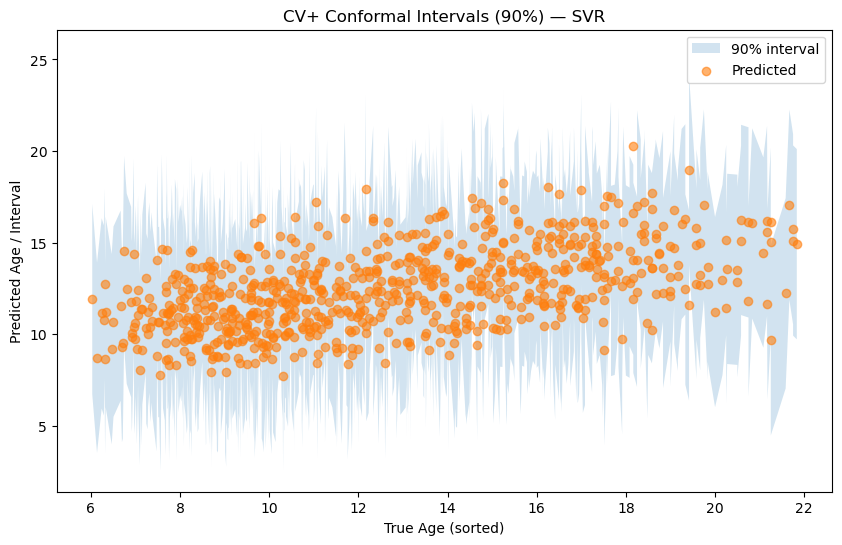

In [32]:
import matplotlib.pyplot as plt

best_model = summary_cvplus.iloc[0]["Model"]
print("Best CV+ model:", best_model)

res = results_full_cvplus[best_model]
order = np.argsort(res["y_test"])

plt.figure(figsize=(10,6))
plt.fill_between(
    res["y_test"][order],
    res["lower"][order],
    res["upper"][order],
    alpha=0.2,
    label="90% interval"
)
plt.scatter(res["y_test"][order], res["y_pred"][order], alpha=0.6, label="Predicted")
plt.xlabel("True Age (sorted)")
plt.ylabel("Predicted Age / Interval")
plt.title(f"CV+ Conformal Intervals (90%) — {best_model}")
plt.legend()
plt.show()

In [33]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor

def conformalized_quantile_regression(
    X, y,
    alpha=0.1,              # 0.1 -> 90% interval
    test_size=0.2,
    cal_size=0.2,
    random_state=42,
    gb_params=None
):
    """
    Conformalized Quantile Regression (CQR):
      1) Split data: train / calibration / test
      2) Fit quantile models on train: lower (alpha/2), upper (1-alpha/2)
      3) On calibration: compute conformity scores s = max(qL - y, y - qU)
      4) qhat = quantile(s, 1-alpha) with finite-sample correction
      5) For test: interval = [qL - qhat, qU + qhat]  (adaptive width)
    """

    if gb_params is None:
        gb_params = dict(
            n_estimators=300,
            max_depth=3,
            learning_rate=0.05,
            random_state=random_state
        )

    # 1) Train/Test split
    X_train_full, X_test, y_train_full, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    # 2) Train/Calibration split (from train_full)
    # cal_size is fraction of original data; convert to fraction of train_full
    cal_frac_of_trainfull = cal_size / (1 - test_size)
    X_train, X_cal, y_train, y_cal = train_test_split(
        X_train_full, y_train_full,
        test_size=cal_frac_of_trainfull,
        random_state=random_state
    )

    # Quantile levels
    q_low = alpha / 2
    q_high = 1 - alpha / 2

    # 3) Fit quantile models on training set
    lower_model = GradientBoostingRegressor(loss="quantile", alpha=q_low, **gb_params)
    upper_model = GradientBoostingRegressor(loss="quantile", alpha=q_high, **gb_params)

    lower_model.fit(X_train, y_train)
    upper_model.fit(X_train, y_train)

    # (Optional) point prediction model for RMSE/R2
    mean_model = GradientBoostingRegressor(loss="squared_error", **gb_params)
    mean_model.fit(X_train, y_train)

    # 4) Calibration conformity scores
    cal_lower = lower_model.predict(X_cal)
    cal_upper = upper_model.predict(X_cal)

    # score = how much y is outside [lower, upper]
    s = np.maximum(cal_lower - y_cal, y_cal - cal_upper)
    s = np.maximum(s, 0)  # clamp negatives to 0

    # finite-sample corrected quantile
    n = len(s)
    k = int(np.ceil((n + 1) * (1 - alpha)))
    qhat = np.sort(s)[min(k - 1, n - 1)]

    # 5) Test predictions + adaptive intervals
    test_lower = lower_model.predict(X_test)
    test_upper = upper_model.predict(X_test)

    lower = test_lower - qhat
    upper = test_upper + qhat

    y_pred = mean_model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    coverage = np.mean((y_test >= lower) & (y_test <= upper))
    avg_width = np.mean(upper - lower)

    return {
        "method": "CQR (adaptive)",
        "rmse": rmse,
        "r2": r2,
        "coverage": coverage,
        "avg_width": avg_width,
        "qhat": qhat,
        "y_test": y_test,
        "y_pred": y_pred,
        "lower": lower,
        "upper": upper,
        "test_lower_raw": test_lower,
        "test_upper_raw": test_upper,
    }

In [34]:
# You already have:
# y = df_fc_only[age_col].values
# X = df_fc_only.drop(columns=[id_col, age_col]).values

res_cqr = conformalized_quantile_regression(X, y, alpha=0.1, random_state=42)

print("RMSE:", res_cqr["rmse"])
print("R2:", res_cqr["r2"])
print("Coverage_90:", res_cqr["coverage"])
print("Avg_Width_90:", res_cqr["avg_width"])

RMSE: 3.3009973239693036
R2: 0.22873235032559724
Coverage_90: 0.9207792207792208
Avg_Width_90: 11.180763883097518


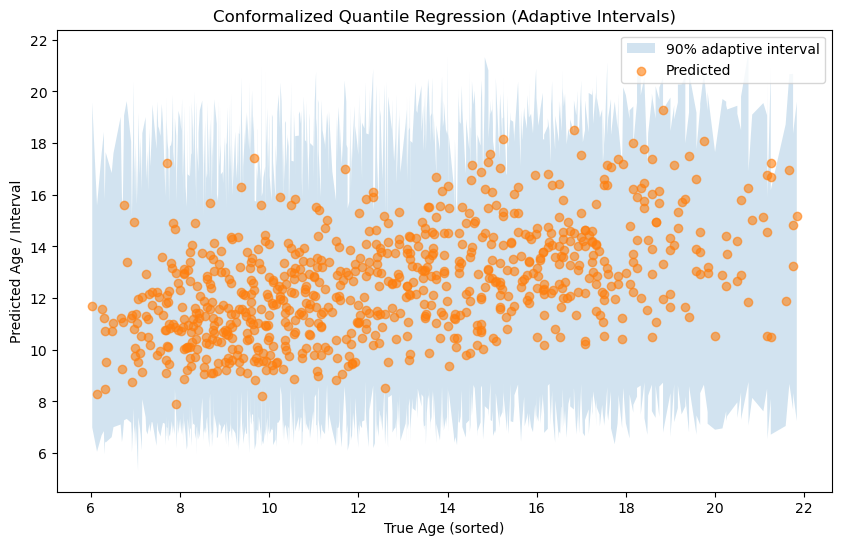

In [35]:
import numpy as np
import matplotlib.pyplot as plt

res = res_cqr
order = np.argsort(res["y_test"])

plt.figure(figsize=(10,6))
plt.fill_between(
    res["y_test"][order],
    res["lower"][order],
    res["upper"][order],
    alpha=0.2,
    label="90% adaptive interval"
)
plt.scatter(res["y_test"][order], res["y_pred"][order], alpha=0.6, label="Predicted")
plt.xlabel("True Age (sorted)")
plt.ylabel("Predicted Age / Interval")
plt.title("Conformalized Quantile Regression (Adaptive Intervals)")
plt.legend()
plt.show()

In [41]:
%who

DummyRegressor	 ElasticNetCV	 GradientBoostingRegressor	 K	 KFold	 LassoCV	 Pipeline	 RandomForestRegressor	 RidgeCV	 
SVR	 StandardScaler	 X	 age_col	 alpha	 best_cv_model	 best_model	 clone	 conformalized_quantile_regression	 
cvplus_conformal_regression	 d	 df_all	 df_combined	 df_fc	 df_fc_min	 df_fc_only	 df_gv	 df_gv_min	 
df_gv_ren	 df_master	 df_sa	 df_sa_min	 df_sa_ren	 df_struct_only	 fc_cols	 fc_path	 get_models	 
gv_cols	 gv_cols_ren	 gv_path	 id_col	 idx	 mean_squared_error	 model	 models	 name	 
np	 order	 out	 pd	 plt	 r2_score	 res	 res_cqr	 res_cv	 
results_all	 results_full	 results_full_cvplus	 results_summary	 results_summary_cvplus	 sa_cols	 sa_cols_ren	 sa_path	 seed	 
split_conformal_regression	 summary_cvplus	 summary_fc	 test_size	 train_test_split	 y	 


In [42]:
best_split_model = summary_fc.iloc[0]["Model"]
res_split = results_full[best_split_model]

In [43]:
import pandas as pd

compare = pd.DataFrame([
    {"Method": "Split", "RMSE": res_split["rmse"], "R2": res_split["r2"],
     "Coverage_90": res_split["coverage"], "Avg_Width_90": res_split["avg_width"]},

    {"Method": "CV-residual", "RMSE": res_cv["rmse"], "R2": res_cv["r2"],
     "Coverage_90": res_cv["coverage"], "Avg_Width_90": res_cv["avg_width"]},

    {"Method": "CQR-adaptive", "RMSE": res_cqr["rmse"], "R2": res_cqr["r2"],
     "Coverage_90": res_cqr["coverage"], "Avg_Width_90": res_cqr["avg_width"]},
])

compare

,Method,RMSE,R2,Coverage_90,Avg_Width_90
0,Split,3.277300,0.243399,0.888312,10.209959
1,CV-residual,3.243234,0.255488,0.903896,10.381466
2,CQR-adaptive,3.300997,0.228732,0.920779,11.180764


In [44]:
print("Best split model:", best_split_model)
print("Best CV model:", summary_cvplus.iloc[0]["Model"])

Best split model: SVR
Best CV model: SVR


### Structural Data with Conformal Split

In [45]:
# Structural dataset
df_struct_only = df_struct_only.dropna(axis=0)

y_struct = df_struct_only[age_col].values
X_struct = df_struct_only.drop(columns=[id_col, age_col]).values

print("Structural X:", X_struct.shape, "y:", y_struct.shape)

Structural X: (3762, 800) y: (3762,)


In [46]:
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.dummy import DummyRegressor

models = {
    "Dummy": Pipeline([
        ("scaler", StandardScaler()),
        ("model", DummyRegressor())
    ]),
    "Ridge": Pipeline([
        ("scaler", StandardScaler()),
        ("model", RidgeCV(alphas=np.logspace(-3,3,30)))
    ]),
    "Lasso": Pipeline([
        ("scaler", StandardScaler()),
        ("model", LassoCV(alphas=np.logspace(-3,3,30), max_iter=5000))
    ]),
    "ElasticNet": Pipeline([
        ("scaler", StandardScaler()),
        ("model", ElasticNetCV(alphas=np.logspace(-3,3,30), l1_ratio=[.1,.5,.9], max_iter=5000))
    ]),
    "SVR": Pipeline([
        ("scaler", StandardScaler()),
        ("model", SVR(kernel="rbf"))
    ]),
    "RandomForest": RandomForestRegressor(
        n_estimators=200, random_state=42, n_jobs=-1
    ),
    "GradientBoosting": GradientBoostingRegressor(
        n_estimators=200, random_state=42
    )
}

In [47]:
import pandas as pd

alpha = 0.1
seed = 42

results_summary_struct_split = []
results_full_struct_split = {}

for name, model in models.items():
    print(f"[STRUCT Split] Running {name}...")
    out = split_conformal_regression(X_struct, y_struct, model, alpha=alpha, random_state=seed)

    results_summary_struct_split.append({
        "Model": name,
        "RMSE": out["rmse"],
        "R2": out["r2"],
        "Coverage_90": out["coverage"],
        "Avg_Width_90": out["avg_width"]
    })
    results_full_struct_split[name] = out

summary_struct_split = pd.DataFrame(results_summary_struct_split).sort_values("RMSE")
summary_struct_split

[STRUCT Split] Running Dummy...
[STRUCT Split] Running Ridge...
[STRUCT Split] Running Lasso...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.362943608981368, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.62058687420722, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.398416835774697, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

[STRUCT Split] Running ElasticNet...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.684244102590128, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.887902842866424, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.111543519576117, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61.67180571717745, tolerance: 2.662630694234832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.903917456927957, tolerance: 2.6370484619926517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.196839867441668, tolerance: 2.6370484619926517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.951447980801277, tolerance: 2.6043875131809306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.366205697730948, tolerance: 2.6043875131809306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.677563448078672, tolerance: 2.6043875131809306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.712668806192596, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.299540358669219, tolerance: 2.6043875131809306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.896364605870076, tolerance: 2.6043875131809306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

[STRUCT Split] Running SVR...
[STRUCT Split] Running RandomForest...
[STRUCT Split] Running GradientBoosting...


,Model,RMSE,R2,Coverage_90,Avg_Width_90
1,Ridge,2.398518,0.590511,0.883134,7.355238
3,ElasticNet,2.409757,0.586665,0.871182,7.390922
2,Lasso,2.460114,0.569209,0.869854,7.602641
4,SVR,2.596079,0.520275,0.876494,7.955554
6,GradientBoosting,2.646044,0.501632,0.893758,8.333377
5,RandomForest,2.891363,0.404939,0.896414,9.332124
0,Dummy,3.754141,-0.003176,0.883134,11.174370


In [49]:
K = 10
test_size = 0.2

results_summary_struct_cv = []
results_full_struct_cv = {}

for name, model in models.items():
    print(f"[STRUCT CV] Running {name}...")
    out = cvplus_conformal_regression(
        X_struct, y_struct, model,
        alpha=alpha, n_splits=K, test_size=test_size, random_state=seed
    )

    results_summary_struct_cv.append({
        "Model": name,
        "RMSE": out["rmse"],
        "R2": out["r2"],
        "Coverage_90": out["coverage"],
        "Avg_Width_90": out["avg_width"]
    })
    results_full_struct_cv[name] = out

summary_struct_cv = pd.DataFrame(results_summary_struct_cv).sort_values("RMSE")
summary_struct_cv

[STRUCT CV] Running Dummy...
[STRUCT CV] Running Ridge...
[STRUCT CV] Running Lasso...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.250070654345109, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.678220662287458, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.912173502659243, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.737475233390796, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.882103381612978, tolerance: 3.110062105714913
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.019251317300586, tolerance: 3.110062105714913
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.272174316090968, tolerance: 3.1047815563083447
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.064881504398727, tolerance: 3.1047815563083447
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.211597767587591, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.159891961062385, tolerance: 3.0644555473496937
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.927407324538763, tolerance: 3.0644555473496937
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.09401604861705, tolerance: 3.0644555473496937
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.110879298335021, tolerance: 3.0837091101229412
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.684159583472137, tolerance: 3.0837091101229412
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.323381709195019, tolerance: 3.0837091101229412
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.454134538567814, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.180131338272986, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.870213289439562, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.842204380468502, tolerance: 3.144121130391245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.619184465611397, tolerance: 3.144121130391245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.8452379354002915, tolerance: 3.144121130391245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.7256155045088235, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.235174297127742, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.327845510043517, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.334563344128583, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.485319158081438, tolerance: 3.085761999194884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.614571779316066, tolerance: 3.085761999194884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

[STRUCT CV] Running ElasticNet...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.285369914746298, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.192341126768952, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.050203832824081, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.764783916342822, tolerance: 3.137669217447636
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.235957066734045, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.264796273095271, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.156566342352562, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.02905242887573, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.614850615605064, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.032287937653564, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.018714201230068, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.96609652326697, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82.23621250900305, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.919413584596441, tolerance: 3.110062105714913
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.24220585243529, tolerance: 3.110062105714913
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39.20705206112689, tolerance: 3.094096431061651
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.122589253076512, tolerance: 3.052352078324675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.515918083787255, tolerance: 3.052352078324675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.41884587862205, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.653783872427084, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.93442697886894, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.805785352624298, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.378591320837586, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.04546373687208, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.36965687371594, tolerance: 3.1047815563083447
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 80.39785941839637, tolerance: 3.1047815563083447
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.67093454030419, tolerance: 3.1047815563083447
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35.987620287094614, tolerance: 3.053706538061827
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.3549439651033, tolerance: 3.053706538061827
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160.0595061713775, tolerance: 3.053706538061827
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.433657237823354, tolerance: 3.053706538061827
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.892862339812382, tolerance: 3.053706538061827
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.672023465384882, tolerance: 3.053706538061827
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.037504210975385, tolerance: 3.1110599804387946
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.46505125618387, tolerance: 3.1110599804387946
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.950321760902625, tolerance: 3.1110599804387946
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.14350694112818, tolerance: 3.0644555473496937
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.093135382193395, tolerance: 3.0627688080128888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.015500770325161, tolerance: 3.0627688080128888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.31151549149763, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.387530708743725, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.84795115158613, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.174274234965196, tolerance: 3.1110599804387946
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.00167717259319, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.327134707697951, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.9369830526557053, tolerance: 3.1332647320150895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.285629743501886, tolerance: 3.0995537127947155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.432583177232118, tolerance: 3.0995537127947155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.220227963866819, tolerance: 3.0708928230880854
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.639499530071589, tolerance: 3.0708928230880854
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.241734900631855, tolerance: 3.0708928230880854
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.0269960937221185, tolerance: 3.0708928230880854
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.786855103306152, tolerance: 3.0708928230880854
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.893479549407857, tolerance: 3.0708928230880854
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.961290488467057, tolerance: 3.1589297694604963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.144643758781058, tolerance: 3.1589297694604963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.5233506790837055, tolerance: 3.1589297694604963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.406826989793444, tolerance: 3.1255951856131268
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.414756640701853, tolerance: 3.1255951856131268
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.309547976205067, tolerance: 3.1255951856131268
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.38406733006468, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.898625269957847, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.3785366417369, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.476479386627943, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.456589435537353, tolerance: 3.1255951856131268
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.075454071053173, tolerance: 3.1255951856131268
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.46780356427189, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.74681660887927, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.98654758811972, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.709925012911299, tolerance: 3.1352031179185884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.675175953905637, tolerance: 3.1352031179185884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.865145096708147, tolerance: 3.1352031179185884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.93418309149638, tolerance: 3.0519110125671656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.521015414636167, tolerance: 3.1352031179185884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.773121886246372, tolerance: 3.1352031179185884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.683281068752876, tolerance: 3.144121130391245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.739976633318292, tolerance: 3.144121130391245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.599937257548845, tolerance: 3.144121130391245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.46214107371452, tolerance: 3.0967423128596407
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.70154141797957, tolerance: 3.0967423128596407
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.563591763535442, tolerance: 3.0967423128596407
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.111536681582038, tolerance: 3.1004834990863355
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.35075323561341, tolerance: 3.1004834990863355
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.8210712094823975, tolerance: 3.0901764901083104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.005724331052079, tolerance: 3.0901764901083104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.684014532387664, tolerance: 3.0901764901083104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.2531009960530355, tolerance: 3.0901764901083104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52.626877411012174, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.63287939631482, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106.61441478301003, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 91.87117307766584, tolerance: 3.0366916386374454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65.78174863297227, tolerance: 3.0366916386374454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115.04965183357217, tolerance: 3.0366916386374454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.181955486893457, tolerance: 3.0989984183574455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.120011154524036, tolerance: 3.0989984183574455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.131985062844251, tolerance: 3.0366916386374454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.530466092172901, tolerance: 3.0989984183574455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.785287385275296, tolerance: 3.0989984183574455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.868194761270388, tolerance: 3.0366916386374454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.305658533694441, tolerance: 3.085761999194884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.010027911318502, tolerance: 3.085761999194884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.737244386604289, tolerance: 3.085761999194884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59.24207190520883, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.74275368808776, tolerance: 3.1041794293749674
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.352879348202805, tolerance: 3.1041794293749674
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.209657936095937, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.248850134856184, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.18765998370509, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.507e+01, tolerance: 3.838e+00
  model = cd_fast.enet_coordinate_descent(


[STRUCT CV] Running SVR...
[STRUCT CV] Running RandomForest...
[STRUCT CV] Running GradientBoosting...


,Model,RMSE,R2,Coverage_90,Avg_Width_90
1,Ridge,2.303168,0.622783,0.908367,7.531753
3,ElasticNet,2.317870,0.617952,0.911023,7.614486
2,Lasso,2.342753,0.609705,0.908367,7.672718
4,SVR,2.535146,0.542969,0.904382,8.293863
6,GradientBoosting,2.569684,0.530431,0.918991,8.723051
5,RandomForest,2.931763,0.388780,0.901726,9.554303
0,Dummy,3.751505,-0.000808,0.899070,11.739748


In [50]:
res_struct_cqr = conformalized_quantile_regression(
    X_struct, y_struct,
    alpha=0.1,
    random_state=42
)

print("STRUCT CQR RMSE:", res_struct_cqr["rmse"])
print("STRUCT CQR R2:", res_struct_cqr["r2"])
print("STRUCT CQR Coverage_90:", res_struct_cqr["coverage"])
print("STRUCT CQR Avg_Width_90:", res_struct_cqr["avg_width"])

STRUCT CQR RMSE: 2.656885299626732
STRUCT CQR R2: 0.4980211428142701
STRUCT CQR Coverage_90: 0.8857901726427623
STRUCT CQR Avg_Width_90: 10.79629975298319


In [51]:
best_struct_split_model = summary_struct_split.iloc[0]["Model"]
best_struct_cv_model = summary_struct_cv.iloc[0]["Model"]

res_struct_split_best = results_full_struct_split[best_struct_split_model]
res_struct_cv_best = results_full_struct_cv[best_struct_cv_model]

compare_struct = pd.DataFrame([
    {"Method": f"Split ({best_struct_split_model})",
     "RMSE": res_struct_split_best["rmse"], "R2": res_struct_split_best["r2"],
     "Coverage_90": res_struct_split_best["coverage"], "Avg_Width_90": res_struct_split_best["avg_width"]},

    {"Method": f"CV-residual ({best_struct_cv_model})",
     "RMSE": res_struct_cv_best["rmse"], "R2": res_struct_cv_best["r2"],
     "Coverage_90": res_struct_cv_best["coverage"], "Avg_Width_90": res_struct_cv_best["avg_width"]},

    {"Method": "CQR-adaptive (GB quantiles)",
     "RMSE": res_struct_cqr["rmse"], "R2": res_struct_cqr["r2"],
     "Coverage_90": res_struct_cqr["coverage"], "Avg_Width_90": res_struct_cqr["avg_width"]}
])

compare_struct

,Method,RMSE,R2,Coverage_90,Avg_Width_90
0,Split (Ridge),2.398518,0.590511,0.883134,7.355238
1,CV-residual (Ridge),2.303168,0.622783,0.908367,7.531753
2,CQR-adaptive (GB quantiles),2.656885,0.498021,0.885790,10.796300


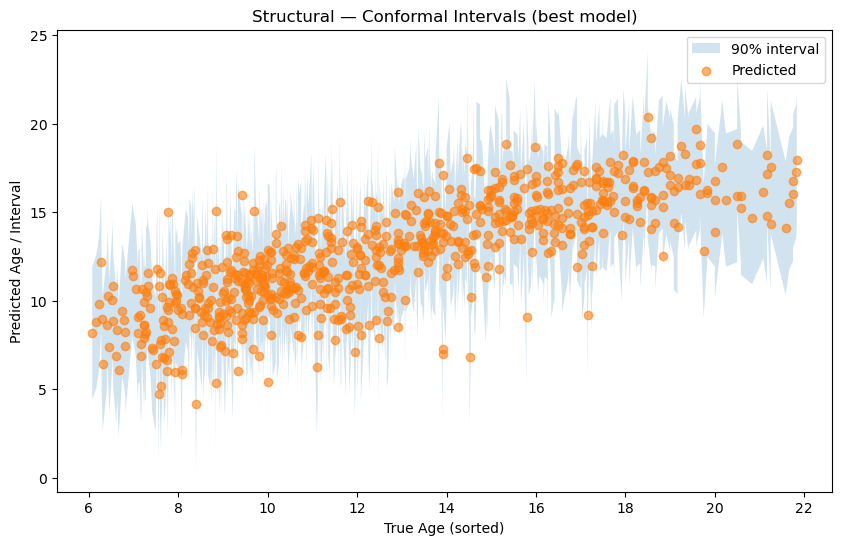

In [52]:
import numpy as np
import matplotlib.pyplot as plt

res = res_struct_cv_best   # or res_struct_split_best
order = np.argsort(res["y_test"])

plt.figure(figsize=(10,6))
plt.fill_between(res["y_test"][order], res["lower"][order], res["upper"][order], alpha=0.2, label="90% interval")
plt.scatter(res["y_test"][order], res["y_pred"][order], alpha=0.6, label="Predicted")
plt.xlabel("True Age (sorted)")
plt.ylabel("Predicted Age / Interval")
plt.title("Structural — Conformal Intervals (best model)")
plt.legend()
plt.show()

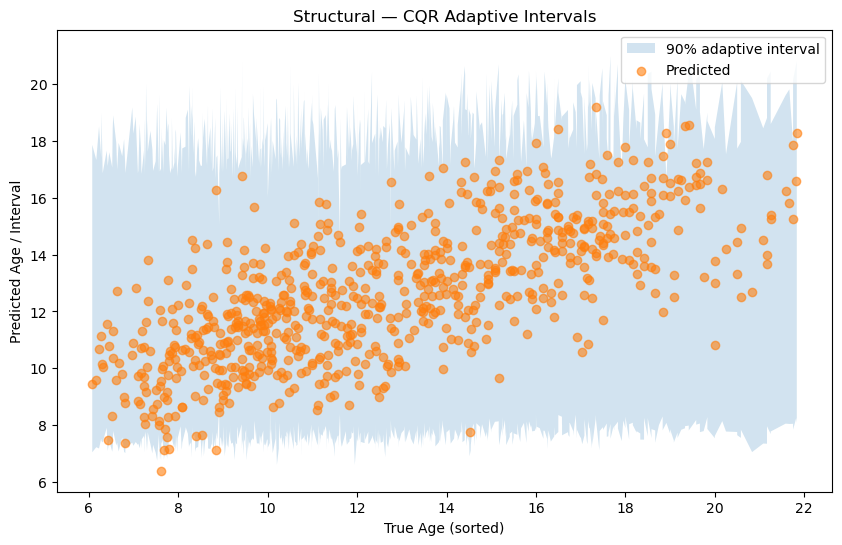

In [53]:
res = res_struct_cqr
order = np.argsort(res["y_test"])

plt.figure(figsize=(10,6))
plt.fill_between(res["y_test"][order], res["lower"][order], res["upper"][order], alpha=0.2, label="90% adaptive interval")
plt.scatter(res["y_test"][order], res["y_pred"][order], alpha=0.6, label="Predicted")
plt.xlabel("True Age (sorted)")
plt.ylabel("Predicted Age / Interval")
plt.title("Structural — CQR Adaptive Intervals")
plt.legend()
plt.show()

### combined dataset (Functional + Structural)

In [19]:
import pandas as pd

# Keep only ID + Age + feature columns
fc_cols_now = [c for c in df_fc_only.columns if c not in [id_col, age_col]]
st_cols_now = [c for c in df_struct_only.columns if c not in [id_col, age_col]]

df_fc_small = df_fc_only[[id_col, age_col] + fc_cols_now].copy()
df_st_small = df_struct_only[[id_col, age_col] + st_cols_now].copy()

# Merge
df_combined3 = pd.merge(
    df_fc_small,
    df_st_small.drop(columns=[age_col]),  # drop duplicate age from structural
    on=id_col,
    how="inner"
)

# Drop missing rows
df_combined3 = df_combined3.dropna(axis=0)

print("FC shape:", df_fc_small.shape)
print("Struct shape:", df_st_small.shape)
print("Combined shape:", df_combined3.shape)

FC shape: (3847, 30)
Struct shape: (3762, 802)
Combined shape: (3762, 830)


In [20]:
y_comb = df_combined3[age_col].values
X_comb = df_combined3.drop(columns=[id_col, age_col]).values

print("Combined X:", X_comb.shape, "y:", y_comb.shape)

Combined X: (3762, 828) y: (3762,)


In [57]:
alpha = 0.1
seed = 42

results_summary_comb_split = []
results_full_comb_split = {}

for name, model in models.items():
    print(f"[COMBINED Split] Running {name}...")
    out = split_conformal_regression(X_comb, y_comb, model, alpha=alpha, random_state=seed)

    results_summary_comb_split.append({
        "Model": name,
        "RMSE": out["rmse"],
        "R2": out["r2"],
        "Coverage_90": out["coverage"],
        "Avg_Width_90": out["avg_width"]
    })
    results_full_comb_split[name] = out

summary_comb_split = pd.DataFrame(results_summary_comb_split).sort_values("RMSE")
summary_comb_split

[COMBINED Split] Running Dummy...
[COMBINED Split] Running Ridge...
[COMBINED Split] Running Lasso...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.121175313305685, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.468244785881325, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.829336648277604, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

[COMBINED Split] Running ElasticNet...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.477859733347941, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.970952297677286, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.075676458205635, tolerance: 2.640667119148624
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.223758757360883, tolerance: 2.662630694234832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.745553586184542, tolerance: 2.6370484619926517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.573122506894833, tolerance: 2.6370484619926517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0475969810959214, tolerance: 2.6043875131809306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.254259136175278, tolerance: 2.662630694234832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.37364387710204, tolerance: 2.662630694234832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.3770220857068125, tolerance: 2.662630694234832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.203264461120853, tolerance: 2.662630694234832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.756555329722232, tolerance: 2.662630694234832
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

[COMBINED Split] Running SVR...
[COMBINED Split] Running RandomForest...
[COMBINED Split] Running GradientBoosting...


,Model,RMSE,R2,Coverage_90,Avg_Width_90
1,Ridge,2.324872,0.615272,0.864542,6.771315
3,ElasticNet,2.352908,0.605937,0.861886,6.972646
2,Lasso,2.394674,0.591823,0.872510,7.251706
4,SVR,2.510137,0.551512,0.871182,7.755319
6,GradientBoosting,2.565816,0.531395,0.876494,7.891379
5,RandomForest,2.929500,0.389138,0.873838,9.090903
0,Dummy,3.754141,-0.003176,0.883134,11.174370


In [59]:
K = 10
test_size = 0.2

results_summary_comb_cv = []
results_full_comb_cv = {}

for name, model in models.items():
    print(f"[COMBINED CV] Running {name}...")
    out = cvplus_conformal_regression(
        X_comb, y_comb, model,
        alpha=alpha, n_splits=K, test_size=test_size, random_state=seed
    )

    results_summary_comb_cv.append({
        "Model": name,
        "RMSE": out["rmse"],
        "R2": out["r2"],
        "Coverage_90": out["coverage"],
        "Avg_Width_90": out["avg_width"]
    })
    results_full_comb_cv[name] = out

summary_comb_cv = pd.DataFrame(results_summary_comb_cv).sort_values("RMSE")
summary_comb_cv

[COMBINED CV] Running Dummy...
[COMBINED CV] Running Ridge...
[COMBINED CV] Running Lasso...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.249872549473366, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.091313741901104, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.549886602838342, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.344177550507084, tolerance: 3.110062105714913
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.804532620234568, tolerance: 3.110062105714913
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.523607584353158, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.282307997960743, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.085137731313807, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.606895043341865, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.067230194408694, tolerance: 3.0627688080128888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.836734968646851, tolerance: 3.0627688080128888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.036488139011453, tolerance: 3.0627688080128888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.348790088415626, tolerance: 3.1589297694604963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.977069110796947, tolerance: 3.1589297694604963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.282572970276306, tolerance: 3.151161189578887
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.276943298425067, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.095109684569252, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.676217787062342, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.107545282065985, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.210158962161586, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.983122750951225, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.301729099106524, tolerance: 3.1041794293749674
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.944804757406018, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.311706234831945, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

[COMBINED CV] Running ElasticNet...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.142953252723601, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.261599432561525, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.973602112898334, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.4746475037673, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.90359850358618, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74.18601256750662, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.8694598836109435, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.26895734532627, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.353067621605078, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.738140448519516, tolerance: 3.0904694115627196
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.610244112879627, tolerance: 3.0904694115627196
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.143567195385003, tolerance: 3.0904694115627196
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.56458867726906, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 78.33786598136521, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.60311078052473, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.414981856320082, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.879448090227015, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.471193835396662, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.591600186522555, tolerance: 3.052352078324675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.6158700701353155, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.95129108866604, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.237e+01, tolerance: 3.864e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.146751359023256, tolerance: 3.1511822988201486
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.256266332694395, tolerance: 3.1511822988201486
  model = cd_fast.enet_coordin

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.724749164321111, tolerance: 3.0780714313205455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.364572847605814, tolerance: 3.0780714313205455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.307963654950072, tolerance: 3.0780714313205455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.808320493446445, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.825261517868057, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.187853341886694, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.170572582835121, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.199065210311346, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.1317854623112, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.565428048996182, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.111464183361022, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.788579241322623, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.543376596165217, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.80469530949449, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.17812179806424, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1793977432998872, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.810106130104941, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.35995392507266, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.448954951217274, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.74389553848323, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.442985280493303, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.080777114110788, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.285759730717473, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.651558837178527, tolerance: 3.0837091101229412
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.89512837663915, tolerance: 3.0995537127947155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.933737416165059, tolerance: 3.0995537127947155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.464117450432241, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.621892382665465, tolerance: 3.0995537127947155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.636639787035165, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5412027076590675, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.178544157139186, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.44160493841537, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.8608529637786, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.937799020311104, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.2051149630106, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.331914483905166, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.924147230998642, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.26670164954703, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.919249541394493, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.404701746410865, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.31915976696928, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48.26001919003647, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2840920102880773, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.29402795745591, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.048323314006666, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.89109365389777, tolerance: 3.1352031179185884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.270440356929612, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.551756005121206, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.904920840965133, tolerance: 3.144121130391245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.24101354148388, tolerance: 3.1004834990863355
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.93473742727656, tolerance: 3.1004834990863355
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.859913543161383, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.4310677617068, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.51148191482116, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.832809500338954, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.926465585634105, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.688304246028565, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.629224459820762, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.557e+00, tolerance: 3.868e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.327153714836641, tolerance: 3.1095016086591714
  model = cd_fast.enet_coordin

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107.94687022118251, tolerance: 3.0930352351159343
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.56193488639747, tolerance: 3.0930352351159343
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.37847242771204, tolerance: 3.0930352351159343
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.023245582414347, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.217257249616523, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.012108763758988, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.778033507903274, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.70252324311423, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.235586806957144, tolerance: 3.0930352351159343
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.751057264117662, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.763737050874624, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.59178644847907, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.73385309734931, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.258994076217277, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48.67237654098608, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.278659950380643, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.659789185297996, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.629088085336662, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/li

[COMBINED CV] Running SVR...
[COMBINED CV] Running RandomForest...
[COMBINED CV] Running GradientBoosting...


,Model,RMSE,R2,Coverage_90,Avg_Width_90
1,Ridge,2.286762,0.628138,0.896414,7.281934
3,ElasticNet,2.298224,0.624401,0.897742,7.325325
2,Lasso,2.318300,0.617810,0.895086,7.365583
4,SVR,2.467597,0.567000,0.900398,8.080306
6,GradientBoosting,2.479445,0.562832,0.920319,8.426282
5,RandomForest,2.859833,0.418404,0.884462,9.243821
0,Dummy,3.751505,-0.000808,0.899070,11.739748


In [60]:
res_comb_cqr = conformalized_quantile_regression(
    X_comb, y_comb,
    alpha=0.1,
    random_state=42
)

print("COMBINED CQR RMSE:", res_comb_cqr["rmse"])
print("COMBINED CQR R2:", res_comb_cqr["r2"])
print("COMBINED CQR Coverage_90:", res_comb_cqr["coverage"])
print("COMBINED CQR Avg_Width_90:", res_comb_cqr["avg_width"])

COMBINED CQR RMSE: 2.5796467596755326
COMBINED CQR R2: 0.5267830470622408
COMBINED CQR Coverage_90: 0.8818061088977424
COMBINED CQR Avg_Width_90: 10.503742812039313


In [61]:
best_comb_split_model = summary_comb_split.iloc[0]["Model"]
best_comb_cv_model = summary_comb_cv.iloc[0]["Model"]

res_comb_split_best = results_full_comb_split[best_comb_split_model]
res_comb_cv_best = results_full_comb_cv[best_comb_cv_model]

compare_comb = pd.DataFrame([
    {"Method": f"Split ({best_comb_split_model})",
     "RMSE": res_comb_split_best["rmse"], "R2": res_comb_split_best["r2"],
     "Coverage_90": res_comb_split_best["coverage"], "Avg_Width_90": res_comb_split_best["avg_width"]},

    {"Method": f"CV-residual ({best_comb_cv_model})",
     "RMSE": res_comb_cv_best["rmse"], "R2": res_comb_cv_best["r2"],
     "Coverage_90": res_comb_cv_best["coverage"], "Avg_Width_90": res_comb_cv_best["avg_width"]},

    {"Method": "CQR-adaptive (GB quantiles)",
     "RMSE": res_comb_cqr["rmse"], "R2": res_comb_cqr["r2"],
     "Coverage_90": res_comb_cqr["coverage"], "Avg_Width_90": res_comb_cqr["avg_width"]}
])

compare_comb

,Method,RMSE,R2,Coverage_90,Avg_Width_90
0,Split (Ridge),2.324872,0.615272,0.864542,6.771315
1,CV-residual (Ridge),2.286762,0.628138,0.896414,7.281934
2,CQR-adaptive (GB quantiles),2.579647,0.526783,0.881806,10.503743


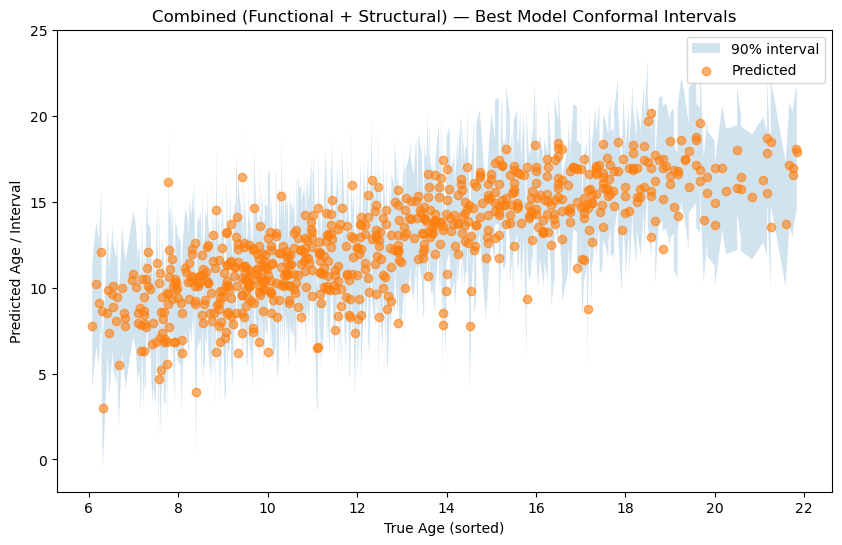

In [62]:
import numpy as np
import matplotlib.pyplot as plt

res = res_comb_cv_best  # or res_comb_split_best
order = np.argsort(res["y_test"])

plt.figure(figsize=(10,6))
plt.fill_between(res["y_test"][order], res["lower"][order], res["upper"][order], alpha=0.2, label="90% interval")
plt.scatter(res["y_test"][order], res["y_pred"][order], alpha=0.6, label="Predicted")
plt.xlabel("True Age (sorted)")
plt.ylabel("Predicted Age / Interval")
plt.title("Combined (Functional + Structural) — Best Model Conformal Intervals")
plt.legend()
plt.show()

### combined with XGBoost

In [17]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.dummy import DummyRegressor
import numpy as np
import xgboost as xgb

def get_models():
    return {
        "Dummy": Pipeline([
            ("scaler", StandardScaler()),
            ("model", DummyRegressor())
        ]),
        
        "Ridge": Pipeline([
            ("scaler", StandardScaler()),
            ("model", RidgeCV(alphas=np.logspace(-3,3,30)))
        ]),
        
        "Lasso": Pipeline([
            ("scaler", StandardScaler()),
            ("model", LassoCV(alphas=np.logspace(-3,3,30), max_iter=5000))
        ]),
        
        "ElasticNet": Pipeline([
            ("scaler", StandardScaler()),
            ("model", ElasticNetCV(alphas=np.logspace(-3,3,30), l1_ratio=[.1,.5,.9], max_iter=500))
        ]),
        
        "SVR": Pipeline([
            ("scaler", StandardScaler()),
            ("model", SVR(kernel="rbf"))
        ]),
        
        "RandomForest": RandomForestRegressor(
            n_estimators=200,
            random_state=42,
            n_jobs=-1
        ),
        
        "GradientBoosting": GradientBoostingRegressor(
            n_estimators=200,
            random_state=42
        ),
        
        "XGBoostQuantile": xgb.XGBRegressor(
            objective="reg:quantileerror",
            quantile_alpha=0.5,
            n_estimators=500,
            max_depth=5,
            learning_rate=0.05,
            subsample=0.8,
            colsample_bytree=0.8,
            reg_lambda=1.0,
            random_state=42,
            n_jobs=-1
        )
    }

In [18]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.base import clone
from sklearn.metrics import mean_squared_error, r2_score

def cvplus_conformal_regression(
    X, y, model,
    alpha=0.1,
    n_splits=10,
    test_size=0.2,
    random_state=42
):
    # outer test split
    X_train_full, X_test, y_train_full, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

    fold_models = []
    fold_residuals = []

    for tr_idx, val_idx in kf.split(X_train_full):
        X_tr, y_tr = X_train_full[tr_idx], y_train_full[tr_idx]
        X_val, y_val = X_train_full[val_idx], y_train_full[val_idx]

        m = clone(model)
        m.fit(X_tr, y_tr)

        y_val_pred = m.predict(X_val)
        res = np.abs(y_val - y_val_pred)

        fold_models.append(m)
        fold_residuals.append(res)

    # point prediction on test (ensemble mean across folds)
    test_preds = np.column_stack([m.predict(X_test) for m in fold_models])
    y_pred = test_preds.mean(axis=1)

    # --- NEW: use CV residuals to compute one qhat like split conformal ---
    all_res = np.concatenate(fold_residuals)   # all out-of-fold absolute residuals

    n = len(all_res)
    k = int(np.ceil((n + 1) * (1 - alpha)))
    qhat = np.sort(all_res)[min(k - 1, n - 1)]

    lower = y_pred - qhat
    upper = y_pred + qhat

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    coverage = np.mean((y_test >= lower) & (y_test <= upper))
    avg_width = np.mean(upper - lower)

    return {
        "method": f"CV+ (K={n_splits})",
        "rmse": rmse,
        "r2": r2,
        "coverage": coverage,
        "avg_width": avg_width,
        "y_test": y_test,
        "y_pred": y_pred,
        "lower": lower,
        "upper": upper
    }

In [22]:
models = get_models()
alpha = 0.1
seed = 42
K = 10
test_size = 0.2

results_summary_comb_cv = []
results_full_comb_cv = {}

for name, model in models.items():
    print(f"[COMBINED CV] Running {name}...")
    out = cvplus_conformal_regression(
        X_comb, y_comb, model,
        alpha=alpha, n_splits=K, test_size=test_size, random_state=seed
    )
    results_summary_comb_cv.append({
        "Model": name,
        "RMSE": out["rmse"],
        "R2": out["r2"],
        "Coverage_90": out["coverage"],
        "Avg_Width_90": out["avg_width"]
    })
    results_full_comb_cv[name] = out

summary_comb_cv = pd.DataFrame(results_summary_comb_cv).sort_values("RMSE")
summary_comb_cv

[COMBINED CV] Running Dummy...
[COMBINED CV] Running Ridge...
[COMBINED CV] Running Lasso...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.249872549473366, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.091313741901104, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.549886602838342, tolerance: 3.178105115960061
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.344177550507084, tolerance: 3.110062105714913
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.804532620234568, tolerance: 3.110062105714913
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.523607584353158, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.282307997960743, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.085137731313807, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.606895043341865, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.067230194408694, tolerance: 3.0627688080128888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.836734968646851, tolerance: 3.0627688080128888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.036488139011453, tolerance: 3.0627688080128888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.348790088415626, tolerance: 3.1589297694604963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.977069110796947, tolerance: 3.1589297694604963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.282572970276306, tolerance: 3.151161189578887
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.276943298425067, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.095109684569252, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.676217787062342, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.107545282065985, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.210158962161586, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.983122750951225, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.301729099106524, tolerance: 3.1041794293749674
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.944804757406018, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.311706234831945, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

[COMBINED CV] Running ElasticNet...


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.142953252723601, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.261599432561525, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.973602112898334, tolerance: 3.153747058559711
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.4746475037673, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.90359850358618, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74.18601256750662, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.8694598836109435, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.26895734532627, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.353067621605078, tolerance: 3.1268767119183383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.738140448519516, tolerance: 3.0904694115627196
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.610244112879627, tolerance: 3.0904694115627196
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.143567195385003, tolerance: 3.0904694115627196
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.56458867726906, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 78.33786598136521, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.60311078052473, tolerance: 3.0722727936304697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.414981856320082, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.879448090227015, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.471193835396662, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.591600186522555, tolerance: 3.052352078324675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.6158700701353155, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.95129108866604, tolerance: 3.125009310229245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.237e+01, tolerance: 3.864e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.146751359023256, tolerance: 3.1511822988201486
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.256266332694395, tolerance: 3.1511822988201486
  model = cd_fast.enet_coordin

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.724749164321111, tolerance: 3.0780714313205455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.364572847605814, tolerance: 3.0780714313205455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.307963654950072, tolerance: 3.0780714313205455
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.808320493446445, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.825261517868057, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.187853341886694, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.170572582835121, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.199065210311346, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.1317854623112, tolerance: 3.108425166682387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.565428048996182, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.111464183361022, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.788579241322623, tolerance: 3.0945400905181493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.543376596165217, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.80469530949449, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.17812179806424, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1793977432998872, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.810106130104941, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.35995392507266, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.448954951217274, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.74389553848323, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.442985280493303, tolerance: 3.0532136816469007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.080777114110788, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.285759730717473, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.651558837178527, tolerance: 3.0837091101229412
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.89512837663915, tolerance: 3.0995537127947155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.933737416165059, tolerance: 3.0995537127947155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.464117450432241, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.621892382665465, tolerance: 3.0995537127947155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.636639787035165, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.5412027076590675, tolerance: 3.10003435765928
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.178544157139186, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.44160493841537, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.8608529637786, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.937799020311104, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.2051149630106, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.331914483905166, tolerance: 3.131827747684816
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.924147230998642, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.26670164954703, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.919249541394493, tolerance: 3.107166597164668
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.404701746410865, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.31915976696928, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48.26001919003647, tolerance: 3.095869315137313
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2840920102880773, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.29402795745591, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.048323314006666, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.89109365389777, tolerance: 3.1352031179185884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.270440356929612, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.551756005121206, tolerance: 3.1138358529325245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.904920840965133, tolerance: 3.144121130391245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.24101354148388, tolerance: 3.1004834990863355
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.93473742727656, tolerance: 3.1004834990863355
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.859913543161383, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.4310677617068, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.51148191482116, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.832809500338954, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.926465585634105, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.688304246028565, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.629224459820762, tolerance: 3.038497120456551
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.557e+00, tolerance: 3.868e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.327153714836641, tolerance: 3.1095016086591714
  model = cd_fast.enet_coordin

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107.94687022118251, tolerance: 3.0930352351159343
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.56193488639747, tolerance: 3.0930352351159343
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.37847242771204, tolerance: 3.0930352351159343
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.023245582414347, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.217257249616523, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.012108763758988, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.778033507903274, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.70252324311423, tolerance: 3.1313840773485446
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.235586806957144, tolerance: 3.0930352351159343
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.751057264117662, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.763737050874624, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.59178644847907, tolerance: 3.082914630636991
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.73385309734931, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.258994076217277, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48.67237654098608, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.278659950380643, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.659789185297996, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.629088085336662, tolerance: 3.03038131769239
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/li

[COMBINED CV] Running SVR...
[COMBINED CV] Running RandomForest...
[COMBINED CV] Running GradientBoosting...
[COMBINED CV] Running XGBoostQuantile...


,Model,RMSE,R2,Coverage_90,Avg_Width_90
1,Ridge,2.286762,0.628138,0.896414,7.281934
3,ElasticNet,2.298224,0.624401,0.897742,7.325325
2,Lasso,2.318300,0.617810,0.895086,7.365583
4,SVR,2.467597,0.567000,0.900398,8.080306
6,GradientBoosting,2.479445,0.562832,0.920319,8.426282
7,XGBoostQuantile,2.612832,0.514530,0.901726,8.633634
5,RandomForest,2.859833,0.418404,0.884462,9.243821
0,Dummy,3.751505,-0.000808,0.899070,11.739748


In [15]:
import joblib
import os

os.makedirs("saved_models", exist_ok=True)

# Save the summary DataFrame
summary_comb_cv.to_csv("saved_models/summary_comb_cv.csv", index=False)

# Save all trained results (models, predictions, intervals, everything)
joblib.dump(results_full_comb_cv, "saved_models/results_full_comb_cv.pkl")

print("Saved all trained models and results.")

NameError: name 'summary_comb_cv' is not defined

In [33]:
import joblib
import pandas as pd

results_full_comb_cv = joblib.load("saved_models/results_full_comb_cv.pkl")
summary_comb_cv = pd.read_csv("saved_models/summary_comb_cv.csv")

print("Loaded trained models and results.")
print(summary_comb_cv)

Loaded trained models and results.
              Model      RMSE        R2  Coverage_90  Avg_Width_90
0             Ridge  2.286762  0.628138     0.896414      7.281934
1        ElasticNet  2.298224  0.624401     0.897742      7.325325
2             Lasso  2.318300  0.617810     0.895086      7.365583
3               SVR  2.467597  0.567000     0.900398      8.080306
4  GradientBoosting  2.479445  0.562832     0.920319      8.426282
5   XGBoostQuantile  2.612832  0.514530     0.901726      8.633634
6      RandomForest  2.859833  0.418404     0.884462      9.243821
7             Dummy  3.751505 -0.000808     0.899070     11.739748


In [16]:
try:
    print("summary_comb_cv exists:", type(summary_comb_cv).__name__)
    print("Ready to save.")
except NameError:
    print("Variables gone — need to retrain once.")

Variables gone — need to retrain once.


In [23]:
import numpy as np
import pandas as pd
import joblib
import os
from time import time

os.makedirs("saved_models", exist_ok=True)

# ---- Rebuild all three feature sets fresh ----
X_fc     = df_fc_only.drop(columns=[id_col, age_col]).values
y_fc     = df_fc_only[age_col].values

X_struct = df_struct_only.drop(columns=[id_col, age_col]).values
y_struct = df_struct_only[age_col].values

X_comb   = df_combined3.drop(columns=[id_col, age_col]).values
y_comb   = df_combined3[age_col].values

print("Functional:", X_fc.shape,     "y:", y_fc.shape)
print("Structural:", X_struct.shape, "y:", y_struct.shape)
print("Multimodal:", X_comb.shape,   "y:", y_comb.shape)

# ---- config ----
N_SPLITS  = 10
K         = 10
ALPHA     = 0.1
TEST_SIZE = 0.2

# ---- 5 models for the figure ----
def get_figure_models():
    from sklearn.pipeline import Pipeline
    from sklearn.preprocessing import StandardScaler
    from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
    from sklearn.svm import SVR
    import xgboost as xgb
    return {
        "Ridge": Pipeline([
            ("scaler", StandardScaler()),
            ("model", RidgeCV(alphas=np.logspace(-3, 3, 15)))
        ]),
        "ElasticNet": Pipeline([
            ("scaler", StandardScaler()),
            ("model", ElasticNetCV(alphas=np.logspace(-3, 3, 15),
                                   l1_ratio=[.1, .5, .9], max_iter=500))
        ]),
        "Lasso": Pipeline([
            ("scaler", StandardScaler()),
            ("model", LassoCV(alphas=np.logspace(-3, 3, 15), max_iter=5000))
        ]),
        "SVR": Pipeline([
            ("scaler", StandardScaler()),
            ("model", SVR(kernel="rbf", cache_size=1000))
        ]),
        "XGBoostQuantile": xgb.XGBRegressor(
            objective="reg:quantileerror",
            quantile_alpha=0.5,
            n_estimators=500, max_depth=5, learning_rate=0.05,
            subsample=0.8, colsample_bytree=0.8, reg_lambda=1.0,
            random_state=42, n_jobs=-1,
        ),
    }

# ---- Datasets ----
datasets = {
    "Functional":  (X_fc,     y_fc),
    "Structural":  (X_struct, y_struct),
    "Multimodal":  (X_comb,   y_comb),
}

# ---- Resume-friendly loop ----
save_path = "saved_models/multiseed_all_datasets_10splits.pkl"

if os.path.exists(save_path):
    all_records = joblib.load(save_path)
    completed = {(r["dataset"], r["model"], r["seed"]) for r in all_records}
    print(f"Resuming: {len(all_records)} records already computed.")
else:
    all_records = []
    completed = set()

total_planned = len(datasets) * 5 * N_SPLITS
print(f"Total planned: {total_planned} | Already done: {len(completed)}")

start_time = time()
for ds_name, (X_ds, y_ds) in datasets.items():
    models = get_figure_models()
    for model_name, model in models.items():
        for seed in range(N_SPLITS):
            key = (ds_name, model_name, seed)
            if key in completed:
                continue
            out = cvplus_conformal_regression(
                X_ds, y_ds, model,
                alpha=ALPHA, n_splits=K,
                test_size=TEST_SIZE, random_state=seed,
            )
            all_records.append({
                "dataset":  ds_name,
                "model":    model_name,
                "seed":     seed,
                "rmse":     out["rmse"],
                "r2":       out["r2"],
                "coverage": out["coverage"],
                "width":    out["avg_width"],
            })
            # Save every 5 seeds
            if (seed + 1) % 5 == 0:
                joblib.dump(all_records, save_path)
                elapsed_min = (time() - start_time) / 60
                print(f"  [{ds_name:11s}/{model_name:16s}] seed {seed+1:2d}/{N_SPLITS}  "
                      f"({len(all_records)}/{total_planned}, {elapsed_min:.1f} min)")

joblib.dump(all_records, save_path)
df_results = pd.DataFrame(all_records)
df_results.to_csv("saved_models/multiseed_all_datasets_10splits.csv", index=False)
print(f"\nDone. Total records: {len(all_records)}")
print(df_results.groupby(["dataset", "model"]).size().unstack())

Functional: (3847, 28) y: (3847,)
Structural: (3762, 800) y: (3762,)
Multimodal: (3762, 828) y: (3762,)
Total planned: 150 | Already done: 0
  [Functional /Ridge           ] seed  5/10  (5/150, 0.0 min)
  [Functional /Ridge           ] seed 10/10  (10/150, 0.0 min)
  [Functional /ElasticNet      ] seed  5/10  (15/150, 0.0 min)
  [Functional /ElasticNet      ] seed 10/10  (20/150, 0.1 min)
  [Functional /Lasso           ] seed  5/10  (25/150, 0.1 min)
  [Functional /Lasso           ] seed 10/10  (30/150, 0.1 min)
  [Functional /SVR             ] seed  5/10  (35/150, 0.7 min)
  [Functional /SVR             ] seed 10/10  (40/150, 1.3 min)
  [Functional /XGBoostQuantile ] seed  5/10  (45/150, 2.0 min)
  [Functional /XGBoostQuantile ] seed 10/10  (50/150, 2.6 min)
  [Structural /Ridge           ] seed  5/10  (55/150, 3.0 min)
  [Structural /Ridge           ] seed 10/10  (60/150, 3.4 min)


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103.16539917398586, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 239.7384233470848, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 394.1308083467293, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1811.2106801302523, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2304.5296857305893, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 100.29148981142498, tolerance: 3.147560901735297
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 661.3732052544415, tolerance: 3.162597755248084
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.403450580097342, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160.34381932404904, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 500.60003095746106, tolerance: 3.162597755248084
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 459.44861984993804, tolerance: 3.162597755248084
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.76231290548458, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110.82796205430168, tolerance: 3.187698877089018
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210.53685854484138, tolerance: 3.187698877089018
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 697.5719625912257, tolerance: 3.187698877089018
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1175.8806397666576, tolerance: 3.07694847508938
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.836735601005785, tolerance: 3.1375737575618703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 69.80243402601445, tolerance: 3.1375737575618703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 407.9947511984101, tolerance: 3.07694847508938
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1149.9320151619381, tolerance: 3.07694847508938
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.29903620366531, tolerance: 3.1375737575618703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 772.8765273553618, tolerance: 3.016346447613691
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1180.6259841958, tolerance: 3.016346447613691
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1722.6434292046617, tolerance: 3.016346447613691
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 210.51052483672538, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 497.1977606092523, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 809.8677656348859, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 287.55054580833166, tolerance: 3.1125490046891753
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 613.318043661257, tolerance: 3.1125490046891753
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 804.7268919896937, tolerance: 3.1125490046891753
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 436.8664373601591, tolerance: 3.1125490046891753
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 844.8793819966158, tolerance: 3.1125490046891753
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.13613600126337, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1358.9454436346523, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1873.602193673035, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103.81415488825587, tolerance: 3.1566173282043337
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 519.8366889362155, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1136.3825917373833, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.958805307909643, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 505.7933287250803, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1029.752823477696, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.42206964506113, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 543.7078870519599, tolerance: 3.081879874309555
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 284.7353671376868, tolerance: 3.081879874309555
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1187.641877825617, tolerance: 3.081879874309555
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 520.5043551631484, tolerance: 2.999827651040525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 714.2194945947226, tolerance: 2.999827651040525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 999.2768511319227, tolerance: 2.999827651040525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.662911205221462, tolerance: 2.999827651040525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102.49042249216654, tolerance: 2.999827651040525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306.31628805904893, tolerance: 2.999827651040525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 254.65154898422588, tolerance: 3.079223064695413
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 425.74916859035056, tolerance: 3.079223064695413
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 866.0382937960712, tolerance: 3.079223064695413
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109.81361875255061, tolerance: 3.151659231320497
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138.52778100741853, tolerance: 3.151659231320497
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 479.25417600467335, tolerance: 3.151659231320497
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 380.71336454100947, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 554.1488554479397, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 703.501274809676, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 293.4590516158414, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 445.4768307679524, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1038.3040093533282, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 685.7673450785155, tolerance: 3.1412120816210787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 563.4659742320564, tolerance: 3.1412120816210787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1431.5662430027926, tolerance: 3.1412120816210787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 270.2877131988025, tolerance: 3.077539793631378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 493.4234922798764, tolerance: 3.077539793631378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 810.9285309475658, tolerance: 3.077539793631378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.58812926501014, tolerance: 3.077539793631378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.31078855863325, tolerance: 3.077539793631378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 314.33050864039797, tolerance: 3.077539793631378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1524.1177199816154, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1894.19161442666, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 86.3052385852734, tolerance: 3.0795305419966206
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 685.5275322328926, tolerance: 3.109904309986978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1016.7004665732443, tolerance: 3.109904309986978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1565.1286284022356, tolerance: 3.109904309986978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 492.95034932000044, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 886.0551778182025, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.80862115860873, tolerance: 3.109904309986978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 640.492895770049, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.032955859292997, tolerance: 3.109904309986978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105.37575077624388, tolerance: 3.109904309986978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1330.7742047238926, tolerance: 3.120583087381717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1821.9909900703553, tolerance: 3.120583087381717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 80.82581343717902, tolerance: 3.129034234409824
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 331.04865834921566, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 879.9231754755356, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.23461247429077, tolerance: 3.120583087381717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 269.5528505604443, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 583.8424447822426, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 886.7665960169661, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/li

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109.52066263942288, tolerance: 3.065793063905429
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62.0847736674923, tolerance: 3.065793063905429
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 147.68117647906092, tolerance: 3.065793063905429
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1253.7529423482956, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1858.4617254796633, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.736566612848037, tolerance: 3.0335192882254165
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99.58650709595804, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108.83675015872177, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179.312739722468, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 295.38717183839526, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 505.74733527451735, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.481e+03, tolerance: 3.878e+00
  model = cd_fast.enet_

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 541.3252494751941, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 703.0156068899446, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1414.1827987944014, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 744.3456959902032, tolerance: 2.931737854075317
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1316.9648157781992, tolerance: 2.931737854075317
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.076499452881762, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 320.4436067743809, tolerance: 2.931737854075317
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 488.05544916446433, tolerance: 2.931737854075317
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.672919730159265, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 91.14114715248434, tolerance: 2.958692493050214
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171.9869534853333, tolerance: 2.958692493050214
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 530.8488906047769, tolerance: 2.958692493050214
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.79521279724031, tolerance: 3.07653626251782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 202.09126937545898, tolerance: 3.07653626251782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 523.1074953877805, tolerance: 3.07653626251782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 463.2822176748209, tolerance: 2.972890748283399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 850.2766553058987, tolerance: 2.972890748283399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.21506410929942, tolerance: 3.07653626251782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 965.334466058252, tolerance: 2.981282134346598
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1349.1159692350138, tolerance: 2.981282134346598
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1660.6148043255118, tolerance: 2.981282134346598
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 718.0059825042817, tolerance: 3.040981926781915
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 937.7112166321504, tolerance: 3.040981926781915
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1683.0836455793585, tolerance: 3.040981926781915
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 894.3101934099668, tolerance: 3.004354402936515
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.419014568118655, tolerance: 3.040981926781915
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.23552207808461, tolerance: 3.040981926781915
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.355260072443343, tolerance: 3.040981926781915
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.03064660759901, tolerance: 3.040981926781915
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151.05490421382729, tolerance: 3.040981926781915
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2215.952999313673, tolerance: 2.949306695398013
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.6780056300322, tolerance: 2.977102653489385
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125.58463944809591, tolerance: 2.977102653489385
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1187.7531327181478, tolerance: 3.04122009118831
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.576140576189573, tolerance: 2.949306695398013
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 85.56952844183616, tolerance: 2.949306695398013
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 185.31266905347456, tolerance: 3.04122009118831
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 780.8267374384427, tolerance: 3.04122009118831
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.216870281279625, tolerance: 2.949306695398013
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 405.2519953814881, tolerance: 3.0425334341965935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 780.4989275372673, tolerance: 3.0425334341965935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1231.2915584622924, tolerance: 3.0425334341965935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 221.99882881684698, tolerance: 2.9641327550285173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 536.9599195962087, tolerance: 2.9641327550285173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 484.2421676957679, tolerance: 2.9641327550285173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 515.9047074178734, tolerance: 3.0039371403810615
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1070.4366400629551, tolerance: 3.0039371403810615
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.61811653492805, tolerance: 2.9641327550285173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.549e+03, tolerance: 3.723e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.20986986181197, tolerance: 2.9479474486558916
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 255.21194419441417, tolerance: 2.9479474486558916
  model = cd_fast.enet_coordi

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 463.67328070213216, tolerance: 2.9576146455181798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1548.9887387416077, tolerance: 2.9576146455181798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1935.5938701599014, tolerance: 2.9576146455181798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1217.2184808178508, tolerance: 2.9260393776169353
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.592984716227875, tolerance: 2.9576146455181798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119.69693943101356, tolerance: 2.9576146455181798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 219.97606600883682, tolerance: 2.9260393776169353
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 581.2150880442914, tolerance: 2.9260393776169353
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.69946538302247, tolerance: 2.9576146455181798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2343.037612972093, tolerance: 3.0692370574918133
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.22092311502638, tolerance: 2.9662963526356636
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 84.51796761656715, tolerance: 2.9662963526356636
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 910.469487647058, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.385758518241346, tolerance: 3.0692370574918133
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 86.07117527113951, tolerance: 3.0692370574918133
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.09319871144453, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 356.4518186415198, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 557.8417636411777, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 557.3125921356432, tolerance: 2.9907205482371766
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 877.8901088463672, tolerance: 2.9907205482371766
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1041.6808688306342, tolerance: 2.9907205482371766
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 174.33790406245953, tolerance: 3.046109513778312
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 399.3059349786463, tolerance: 3.046109513778312
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 831.971063802082, tolerance: 3.046109513778312
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 476.933023449129, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 332.9459194267083, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 881.3552096829253, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/py

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 238.40425763801795, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 327.7189540247655, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 623.8295452529032, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 951.3695556138682, tolerance: 2.975597266112888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1890.3117146844556, tolerance: 2.975597266112888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2156.1743779272297, tolerance: 2.975597266112888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 443.10000794702046, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 603.538512615401, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1075.9475662514642, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.14539536932898, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.5929113953207, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 304.30788673796906, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2374.316273345228, tolerance: 2.9727606312679002
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 69.09628156807594, tolerance: 3.0635058813589615
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.56972136786135, tolerance: 3.0635058813589615
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 647.9145246551561, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1632.1679998020688, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1682.7664529327783, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1136.8600655794348, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.63889290977204, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60.78443061241251, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 846.3500588045704, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.19944925465461, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 118.9437614372473, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2140.9560532596424, tolerance: 3.074692608223361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.44496685650483, tolerance: 3.0469564911809255
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83.79925058841218, tolerance: 3.0469564911809255
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 903.0392036114081, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.986073670985206, tolerance: 3.074692608223361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110.00242375396283, tolerance: 3.074692608223361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 220.25137986535628, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 444.96109103256504, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.85120277911301, tolerance: 3.074692608223361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49.644375708592634, tolerance: 3.001525260855819
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 262.9350836200747, tolerance: 3.001525260855819
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 582.5678371750428, tolerance: 3.001525260855819
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2295.9985518333615, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.08285310607789, tolerance: 3.074833353454408
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76.60096221737695, tolerance: 3.074833353454408
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 282.1706458567687, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 463.1743585990189, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 654.8940575328506, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 230.6662742499111, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 693.2460566796567, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.760e+03, tolerance: 3.809e+00
  model = cd_fast.enet_co

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 507.94486094200965, tolerance: 3.0060184650238475
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 744.2051775584605, tolerance: 3.0060184650238475
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1119.5651169610423, tolerance: 3.0060184650238475
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 311.0952921058797, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 851.1939959259507, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1509.168618889295, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 421.81937014078176, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 353.1969817127356, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 660.0482976002227, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1726.4225507402116, tolerance: 2.996439903233339
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.66632119110363, tolerance: 3.070020927957729
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 220.74937995305845, tolerance: 3.070020927957729
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1353.0864904150708, tolerance: 3.0823682504188796
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.141239240561845, tolerance: 2.996439903233339
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83.46862478170806, tolerance: 2.996439903233339
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 326.5592899939875, tolerance: 3.0823682504188796
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 417.17841971862526, tolerance: 3.0823682504188796
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 905.3360989728362, tolerance: 3.0823682504188796
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1025.476012215303, tolerance: 3.0741373678741017
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1324.7208590580676, tolerance: 3.0741373678741017
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1464.3541280375016, tolerance: 3.0741373678741017
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 344.15335054557636, tolerance: 3.0731982750211206
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 699.8865539771614, tolerance: 3.0731982750211206
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1202.6868985747337, tolerance: 3.0731982750211206
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 167.83834291745552, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 256.52791735467326, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 548.2644956581094, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 163.0650298007049, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160.6255514010718, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 410.2371643578176, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/li

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1097.1144074583917, tolerance: 3.094946784136873
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1336.5417742693708, tolerance: 3.094946784136873
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1824.4488872342881, tolerance: 3.094946784136873
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149.1452233759992, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 423.9914297495279, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 535.6580259461216, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1209.5829844116492, tolerance: 3.08080222502409
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.472750529233963, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36.06924976520531, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1230.1314437018814, tolerance: 3.095070703253994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1661.4620785491186, tolerance: 3.095070703253994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2222.6498618420947, tolerance: 3.095070703253994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 545.9770276215304, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 850.429676733037, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1223.4793917746933, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 302.3645851083593, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 517.7148315698864, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1067.480134355736, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 226.36738527655598, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 589.463286145573, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.198480433331497, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1025.6509318540234, tolerance: 3.0976961013913735
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1996.0478699695175, tolerance: 3.0976961013913735
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2280.650533403247, tolerance: 3.0976961013913735
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 203.58284878927498, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 269.8004070812658, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 842.784971154957, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.024769830059086, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93.53057259041088, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119.13871376277712, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2316.4382475869565, tolerance: 3.090332323283225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61.8054325324556, tolerance: 2.9890015570833435
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144.76150583373783, tolerance: 2.9890015570833435
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1026.1805950813346, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1226.2243725093995, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1732.9441897627519, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1014.883918994301, tolerance: 3.0265009699522865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.540412858545096, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 100.0100363450747, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.398130461777328, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 86.61727726879963, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170.53716339357197, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2051.628345434065, tolerance: 3.0646820492695985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107.83167388996844, tolerance: 2.9892278171983637
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 155.2357477851192, tolerance: 2.9892278171983637
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1105.777706962922, tolerance: 2.980659338061064
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.18561539226903, tolerance: 3.0646820492695985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 89.30164750797212, tolerance: 3.0646820492695985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171.70543932713645, tolerance: 2.980659338061064
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 529.059246743232, tolerance: 2.980659338061064
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.774668288933754, tolerance: 3.0646820492695985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 246.58807890749813, tolerance: 3.131559174397445
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 854.1932276724442, tolerance: 3.131559174397445
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1537.9241913685687, tolerance: 3.131559174397445
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2268.6782320517023, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.97789931479565, tolerance: 3.141741422398147
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 218.82240991983144, tolerance: 3.141741422398147
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 274.09920248428443, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 282.63426992579025, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 600.6656316315498, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 348.9774320488932, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 757.8611567783641, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.749e+03, tolerance: 3.916e+00
  model = cd_fast.enet_co

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 359.5568090979823, tolerance: 3.0563963192392176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 874.8384042722964, tolerance: 3.0563963192392176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1341.327221930479, tolerance: 3.0563963192392176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 465.3333220721088, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 939.4102869104672, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1193.8174272015003, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 294.66096611460216, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 324.71833335287556, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 813.0840119811069, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2350.7121026756213, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110.24383027604017, tolerance: 3.1117375846404527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165.47668488903764, tolerance: 3.1117375846404527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1353.52384760991, tolerance: 3.1299428898772876
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.140771065383888, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 222.09802203819618, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 460.2248371880032, tolerance: 3.1299428898772876
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 446.7765306285355, tolerance: 3.1299428898772876
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 815.293016247082, tolerance: 3.1299428898772876
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1385.8461031731777, tolerance: 3.1317142994823572
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1288.5851458955613, tolerance: 3.1317142994823572
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2067.2456912061107, tolerance: 3.1317142994823572
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 239.6763604786138, tolerance: 3.112806527027953
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 712.794233859222, tolerance: 3.112806527027953
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 926.9351226379831, tolerance: 3.112806527027953
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 320.0655186825843, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 630.4036916530117, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1049.1294396567532, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 308.9923200639996, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 477.84846292489783, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 778.2891193569931, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1165.4836903463374, tolerance: 3.0495845730929267
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1609.7989358375976, tolerance: 3.0495845730929267
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1844.787896258966, tolerance: 3.0495845730929267
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 437.8471862180786, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 574.4766910155622, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1138.2796219492452, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1046.1431619278205, tolerance: 3.093887396057669
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63.319788206257726, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.80918262126761, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2000.4023508860596, tolerance: 3.1237495195607843
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2285.526532715759, tolerance: 3.1237495195607843
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93.27534515149455, tolerance: 3.1049405747295173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 930.5597558609775, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1182.6132834539148, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1843.2395509371647, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 831.4322130540704, tolerance: 3.05567970193713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1044.418282157932, tolerance: 3.05567970193713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.43923416979669, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 642.5055148145352, tolerance: 3.05567970193713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.55153235410762, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 167.61327337110924, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2093.4631621402386, tolerance: 3.050423368309128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2433.878076629496, tolerance: 3.050423368309128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166.1083185095631, tolerance: 3.031852248801221
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1101.1281039489409, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1461.5988976913604, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.15454485322698, tolerance: 3.050423368309128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 674.5416137410489, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 983.3628298415188, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 71.87534361536927, tolerance: 3.050423368309128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 748.8155837736049, tolerance: 3.081525397400765
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1424.0618521576243, tolerance: 3.081525397400765
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1467.2993020074205, tolerance: 3.081525397400765
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.989439119628514, tolerance: 3.116721597592254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 163.88459584826433, tolerance: 3.116721597592254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 425.19025508444156, tolerance: 3.116721597592254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 437.6820226809632, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 418.5375646452312, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 867.8414920117752, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 744.2902660619502, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.689e+03, tolerance: 3.871e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138.6928708893338, tolerance: 3.12792607844218
  model = cd_fast.enet_coordinat

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1544.851268934183, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2070.0389851258587, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2328.396170961134, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1546.3340516048188, tolerance: 3.0990899458577834
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.880103216522912, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 89.61368297774607, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 970.7408476712085, tolerance: 3.0990899458577834
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.88706692285814, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.22467236001012, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164.5606043692369, tolerance: 3.088745099114539
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 764.1270164475209, tolerance: 3.088745099114539
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1038.6091932473018, tolerance: 3.088745099114539
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 375.53377725007704, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 708.036718294858, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1086.0961774956427, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1019.749753431638, tolerance: 3.1060093704435894
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48.726840086144875, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113.22733242492632, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1332.3689285680357, tolerance: 3.128339246553896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2164.40341472665, tolerance: 3.128339246553896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2262.8653545697694, tolerance: 3.128339246553896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 714.2976403022867, tolerance: 3.1639527123525957
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1167.6400741608159, tolerance: 3.1639527123525957
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1418.662160056515, tolerance: 3.1639527123525957
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 503.53512314894397, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 758.5334940441439, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1251.7044095813912, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 301.00348480126104, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401.85888987174985, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 623.9982179911026, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 641.7700986833884, tolerance: 3.1530576122426983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 862.5220652038447, tolerance: 3.1530576122426983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1312.8593310830847, tolerance: 3.1530576122426983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 319.90300225419014, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 609.0309737759248, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 759.0990512117451, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 910.7858865256444, tolerance: 3.1035640840830863
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.721516905749013, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183.48720728286844, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1829.103646854197, tolerance: 3.1254397516956542
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1736.1610854326077, tolerance: 3.1254397516956542
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97.9652670598116, tolerance: 3.1119947357098323
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 778.4529102682554, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1170.9657232336485, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1750.0592439154127, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 688.2456411091975, tolerance: 3.133396786410593
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1200.750222992116, tolerance: 3.133396786410593
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.281977187714801, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 616.9505245982978, tolerance: 3.133396786410593
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.0859212078085, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 54.559475461780494, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1681.9199585470897, tolerance: 3.1303808825483785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1917.9665442782866, tolerance: 3.1303808825483785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77.68577826168621, tolerance: 3.106126623897131
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 761.1805015278619, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1257.3514362983046, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.784371923866274, tolerance: 3.1303808825483785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 354.73571187431935, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 405.6844407264425, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 548.1812563844355, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 107.41099046625095, tolerance: 3.1125237475242877
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 295.50228838767725, tolerance: 3.1125237475242877
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 334.71857491793617, tolerance: 3.1125237475242877
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1547.6233491180294, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1935.1670088645296, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.69816971585169, tolerance: 3.0827649392528484
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.619584534639216, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136.76438754278024, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119.41435104425182, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 220.93985876508577, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 416.24477629974626, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1234.805608291154, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 416.0247818764401, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 909.1997851803549, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1037.9318226214054, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 505.84063620699, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 632.8249977059427, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1300.195398060344, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 242.5682098496136, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 393.4556104962894, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 880.0994829049741, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2148.736807765418, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.66258603412643, tolerance: 3.12393690597381
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162.74036708689619, tolerance: 3.12393690597381
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1296.2543187314973, tolerance: 3.0688464466536005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.823215587353843, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153.16099831405973, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 250.67570440311738, tolerance: 3.0688464466536005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 251.03689182129347, tolerance: 3.0688464466536005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 776.3509017275778, tolerance: 3.0688464466536005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1159.1250542026933, tolerance: 3.140445938145301
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1442.4805863230454, tolerance: 3.140445938145301
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2222.331807981992, tolerance: 3.140445938145301
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 195.11544019099074, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 543.3837296502788, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1159.0930127910278, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 170.3553554389673, tolerance: 3.137370777421121
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 247.5040856254236, tolerance: 3.137370777421121
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 715.2109547858213, tolerance: 3.137370777421121
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 294.8825667668152, tolerance: 3.137370777421121
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 417.6739990681572, tolerance: 3.137370777421121
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 972.8621833760121, tolerance: 3.137370777421121
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 745.9030062972879, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 869.5761911900186, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1477.9112997781597, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 272.88717672771145, tolerance: 3.0767235442070544
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 318.74369544088586, tolerance: 3.0767235442070544
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 599.7789250503847, tolerance: 3.0767235442070544
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 824.3685800737735, tolerance: 3.120065876715369
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.16670143225929, tolerance: 3.0767235442070544
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137.2505121860986, tolerance: 3.0767235442070544
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2133.67535527449, tolerance: 3.101419706350368
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2215.6653293775853, tolerance: 3.101419706350368
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111.46454168048695, tolerance: 3.079410165087001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 929.4046256185452, tolerance: 3.1168314980809875
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1378.3385059858642, tolerance: 3.1168314980809875
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1904.4532972161223, tolerance: 3.1168314980809875
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 615.7191941960914, tolerance: 3.1390865415718254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1113.2134268747318, tolerance: 3.1390865415718254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.346795216333703, tolerance: 3.1168314980809875
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 682.7064327606058, tolerance: 3.1390865415718254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52.84513376675204, tolerance: 3.1168314980809875
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53.9181433726817, tolerance: 3.1168314980809875
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

  [Structural /ElasticNet      ] seed  5/10  (65/150, 13.0 min)


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 80.29802811272202, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.34802068677527, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 252.13794261811654, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1999.6125831541403, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2455.403769847735, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 78.5822678415243, tolerance: 3.102751907736579
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.061383678406855, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149.40578392876523, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 258.64318920326696, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38.48821425523056, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 89.53978803278642, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 226.13957891770588, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 138.27945969569555, tolerance: 3.0315387976357844
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 420.9585227291427, tolerance: 3.0315387976357844
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 851.6155272964997, tolerance: 3.0315387976357844
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 308.1192279218885, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 443.4260503775713, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 924.5740907091081, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 524.6178086782197, tolerance: 3.114943576090505
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 64.10120342808477, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129.8428401190131, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1426.815798384261, tolerance: 3.0709728782297896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1585.9094298447137, tolerance: 3.0709728782297896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.65412326862679, tolerance: 3.0468681172647436
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 806.4456802006748, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 764.6070793438912, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1384.8947894272194, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 806.6115056384897, tolerance: 3.0718549514034104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1197.6083232585274, tolerance: 3.0718549514034104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.686650726980588, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 491.56913569712106, tolerance: 3.0718549514034104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.656119442752242, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60.787600678856506, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2050.3414603669175, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2557.385872559441, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 87.72576237408066, tolerance: 3.0986398282132868
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 433.80287894434605, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 977.5346763177017, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.575580285056276, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 433.80442275415953, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 417.61882437766053, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1133.1651643663122, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117.71309051719982, tolerance: 3.0333185039164383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181.42720161694433, tolerance: 3.0333185039164383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 466.890611318574, tolerance: 3.0333185039164383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1304.6280893595285, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2227.0437431625624, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.103301409018968, tolerance: 3.102484008383936
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.687061939643172, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.08063653398858, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224.3548452138357, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 200.62744213983115, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 403.32180389469704, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 772.6691739909174, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 435.8041178121466, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1216.8598413794139, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1205.06342758028, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 404.7222219344767, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 524.1246449038827, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1067.7000461758403, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 251.41736940134342, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188.7843247539704, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 502.3421100489286, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2031.2519930049602, tolerance: 3.046414041008199
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121.40113366804871, tolerance: 2.980980992538577
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.82265725080197, tolerance: 2.980980992538577
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 606.1598155394399, tolerance: 3.077560802843359
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.44916327251303, tolerance: 3.046414041008199
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145.60578034990795, tolerance: 3.046414041008199
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 161.3549194039333, tolerance: 3.077560802843359
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 205.55772518914182, tolerance: 3.077560802843359
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 354.63304238630917, tolerance: 3.077560802843359
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 155.21798333013248, tolerance: 3.1172320940358063
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 502.9956426488716, tolerance: 3.1172320940358063
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 792.7990962369281, tolerance: 3.1172320940358063
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 78.48638636575379, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197.2261865908622, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 615.522180443335, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 181.7978957777923, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 361.9789326137052, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 408.1521100291302, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126.77902548809561, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 264.4356781023653, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 491.24559979711785, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 934.3301846346544, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1543.3897520625624, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1976.9987520754978, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 334.313584521743, tolerance: 3.063220397433005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 628.9083596550231, tolerance: 3.063220397433005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1152.553516667043, tolerance: 3.063220397433005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.568510470709953, tolerance: 3.063220397433005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102.481390092953, tolerance: 3.063220397433005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 304.09858958659515, tolerance: 3.063220397433005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1173.8178943964513, tolerance: 3.09040466551287
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1447.0944394059845, tolerance: 3.09040466551287
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 88.48451573183229, tolerance: 3.044765551428215
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1038.7104837678025, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 541.9012532489696, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1386.7710951822799, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 408.89334434036664, tolerance: 3.082288802356948
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1185.5190472482486, tolerance: 3.082288802356948
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.527040020906497, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 679.6634612744133, tolerance: 3.082288802356948
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.832133292797153, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.17005736364354, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1264.6138410570939, tolerance: 3.039789766777319
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1867.5406593096216, tolerance: 3.039789766777319
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.60604997154405, tolerance: 3.1106246060521623
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 385.0595331959521, tolerance: 3.0862564039011
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 743.8370134618112, tolerance: 3.0862564039011
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.333373575624137, tolerance: 3.039789766777319
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/li

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 251.17749241911133, tolerance: 3.0862564039011
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 265.91472741268535, tolerance: 3.0862564039011
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 880.8113821250181, tolerance: 3.0862564039011
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.47849111698088, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 180.69790404880223, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 437.75363079770796, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1824.1839529829929, tolerance: 3.1238207693773736
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2529.405448770677, tolerance: 3.1238207693773736
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.98846625704209, tolerance: 3.1206518483099015
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.798430676368298, tolerance: 3.1238207693773736
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.798750279045635, tolerance: 3.1238207693773736
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 281.3795816924903, tolerance: 3.1238207693773736
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 387.7985142499201, tolerance: 3.1238207693773736
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 301.4922216597497, tolerance: 3.1238207693773736
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 872.179103519602, tolerance: 3.1238207693773736
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169.76036298516192, tolerance: 3.1198090080963237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 354.5324100637681, tolerance: 3.1198090080963237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 645.4940283247206, tolerance: 3.1198090080963237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 477.510571772852, tolerance: 3.0249047038297423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 613.5118244068499, tolerance: 3.0249047038297423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1304.9116567225765, tolerance: 3.0249047038297423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 146.59776454765597, tolerance: 3.0249047038297423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280.6952256003606, tolerance: 3.0249047038297423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 752.5795428601391, tolerance: 3.0249047038297423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2090.994447586499, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.23168062620243, tolerance: 3.0834169755265717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.28857260751738, tolerance: 3.0834169755265717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1467.9414762704039, tolerance: 3.1065582296386114
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.880632293630697, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.68079184506314, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 212.84390284121582, tolerance: 3.1065582296386114
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 429.7131201009224, tolerance: 3.1065582296386114
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 828.985827003517, tolerance: 3.1065582296386114
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 881.6251957233835, tolerance: 3.09807128646055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 827.1784198935516, tolerance: 3.09807128646055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1518.3369293095354, tolerance: 3.09807128646055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 189.4748914650745, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 716.8189772553715, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 946.2686455845305, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193.8891331511477, tolerance: 3.1102224703723156
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 344.94199460103664, tolerance: 3.1102224703723156
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 362.54011298890873, tolerance: 3.1102224703723156
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149.32493757220982, tolerance: 3.1102224703723156
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 204.3906514584305, tolerance: 3.1102224703723156
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 999.6885055911389, tolerance: 3.1102224703723156
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 704.8289189518646, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 446.27145948530006, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1395.3829917559972, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 226.4348181386149, tolerance: 3.1252814020450748
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 404.24626704700586, tolerance: 3.1252814020450748
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 757.3503271639565, tolerance: 3.1252814020450748
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 780.3225369031147, tolerance: 3.1011713955016416
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 64.64585632285343, tolerance: 3.1252814020450748
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158.62201355012348, tolerance: 3.1252814020450748
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1293.9244851596811, tolerance: 3.0680495322198014
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1987.742111120588, tolerance: 3.0680495322198014
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 91.92765669121036, tolerance: 3.1045445657278163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 818.6235738072323, tolerance: 3.083584934591964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1256.5143959532043, tolerance: 3.083584934591964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1668.2698766025617, tolerance: 3.083584934591964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 245.97594039945398, tolerance: 3.1101327449012506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 758.1884871052075, tolerance: 3.1101327449012506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.869690393716155, tolerance: 3.083584934591964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 621.525186344255, tolerance: 3.1101327449012506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.0399652459364, tolerance: 3.083584934591964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 87.99919244698958, tolerance: 3.083584934591964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1776.7936931139031, tolerance: 3.071068472747105
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2216.1968051295803, tolerance: 3.071068472747105
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 88.47563744735089, tolerance: 3.1307951283903686
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 498.6214378516852, tolerance: 3.1251806428200584
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 669.188171819791, tolerance: 3.1251806428200584
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.994929204211076, tolerance: 3.071068472747105
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162.89248250594756, tolerance: 3.1251806428200584
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 261.86312398154496, tolerance: 3.1251806428200584
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 596.0886518463853, tolerance: 3.1251806428200584
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119.663400723417, tolerance: 3.085379159314115
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129.97221019015433, tolerance: 3.085379159314115
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 369.46904204266957, tolerance: 3.085379159314115
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1561.233274512474, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2284.15674398608, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.68018977877182, tolerance: 3.0917313017584918
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.800709282035314, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 124.32276869036923, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 166.82655336915195, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 231.54138682816665, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 282.8396542409637, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 569.095242618962, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136.32791397445726, tolerance: 3.173932802728898
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 314.48119935712657, tolerance: 3.173932802728898
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 581.2985280539574, tolerance: 3.173932802728898
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144.53529807017367, tolerance: 3.1144317363990304
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 312.98410747976413, tolerance: 3.1144317363990304
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 414.0406701593324, tolerance: 3.1144317363990304
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.354484875362687, tolerance: 3.1144317363990304
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115.70407683644953, tolerance: 3.1144317363990304
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 234.62516299022263, tolerance: 3.1144317363990304
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 877.0274766085449, tolerance: 3.056520813062495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 792.334469283107, tolerance: 3.056520813062495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1164.837536242072, tolerance: 3.056520813062495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 231.35305434070142, tolerance: 3.1276902854242885
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 546.0663063528332, tolerance: 3.1276902854242885
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 756.8019360365233, tolerance: 3.1276902854242885
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 669.4323957262732, tolerance: 3.1291306095920923
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1431.53962749488, tolerance: 3.1291306095920923
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.01738718442539, tolerance: 3.1276902854242885
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.590e+03, tolerance: 3.875e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112.86703241308896, tolerance: 3.123206853550024
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.33261087422852, tolerance: 3.123206853550024
  model = cd_fast.enet_coordina

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1376.5034430262854, tolerance: 3.08888455457336
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1635.893326680485, tolerance: 3.08888455457336
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2037.8110229864753, tolerance: 3.08888455457336
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 935.3286692754259, tolerance: 3.0886576180677907
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.70637988422641, tolerance: 3.08888455457336
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103.18955002089842, tolerance: 3.08888455457336
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1123.6215815852506, tolerance: 3.0886576180677907
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.20914298037496, tolerance: 3.08888455457336
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 48.786040364542714, tolerance: 3.08888455457336
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169.57058002391568, tolerance: 3.0695838558299613
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 357.6610355350349, tolerance: 3.0695838558299613
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 822.3468320420084, tolerance: 3.0695838558299613
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 442.79629622404354, tolerance: 3.0933778354111237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 326.7010797894309, tolerance: 3.0933778354111237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1004.8128190217299, tolerance: 3.0933778354111237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 538.7882284595739, tolerance: 3.113721799112226
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42.89549270733551, tolerance: 3.0933778354111237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112.30007168452994, tolerance: 3.0933778354111237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1559.1320791508847, tolerance: 3.145259738912379
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2197.120344081916, tolerance: 3.145259738912379
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133.84225810228418, tolerance: 3.0887751402924124
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 683.1321746737576, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 934.5776276960764, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1804.2667795568907, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 876.8555101669854, tolerance: 3.119145537849543
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 889.0716054323702, tolerance: 3.119145537849543
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29.355803498152454, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 691.776897922763, tolerance: 3.119145537849543
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60.68451194257068, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110.86428533183698, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1974.4107423240346, tolerance: 3.036517190898128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2172.6068918886417, tolerance: 3.036517190898128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 90.69820327401794, tolerance: 3.0588387932589614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 676.6220618424786, tolerance: 3.044520997200041
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 999.3638555677226, tolerance: 3.044520997200041
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.385528710030485, tolerance: 3.036517190898128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 319.89865245596593, tolerance: 3.044520997200041
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158.32768557716554, tolerance: 3.044520997200041
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 854.5861354378053, tolerance: 3.044520997200041
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.01115143699462, tolerance: 3.089487087625316
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 192.34797311978036, tolerance: 3.089487087625316
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 410.433723913975, tolerance: 3.089487087625316
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1982.942790500484, tolerance: 3.1208931568248963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2292.0601863611664, tolerance: 3.1208931568248963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.759733140377648, tolerance: 3.145279948296964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29.216387978925923, tolerance: 3.1208931568248963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121.36846772352692, tolerance: 3.1208931568248963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 293.99351131608546, tolerance: 3.1208931568248963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 590.4749908264448, tolerance: 3.1208931568248963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 514.0792794708514, tolerance: 3.1208931568248963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 936.2153766563756, tolerance: 3.1208931568248963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 433.9457775527899, tolerance: 3.0661077443351994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 623.8629605024953, tolerance: 3.0661077443351994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1113.9600290535777, tolerance: 3.0661077443351994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 419.4163271630114, tolerance: 3.0862474800301203
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 641.0035907840484, tolerance: 3.0862474800301203
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1334.2665101165564, tolerance: 3.0862474800301203
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140.20591574957962, tolerance: 3.0862474800301203
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139.0214859153557, tolerance: 3.0862474800301203
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 699.4907928025773, tolerance: 3.0862474800301203
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1882.9154616869898, tolerance: 3.0524056051928903
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103.15107576989612, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 277.3082494525943, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1281.8110287416362, tolerance: 3.1293884165259485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.405668612056616, tolerance: 3.0524056051928903
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102.63404691947653, tolerance: 3.0524056051928903
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 207.62237399623154, tolerance: 3.1293884165259485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 463.65965882854834, tolerance: 3.1293884165259485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 818.189178637404, tolerance: 3.1293884165259485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 580.1434814483569, tolerance: 3.094879083109706
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1112.0673749417515, tolerance: 3.094879083109706
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1799.8604266581583, tolerance: 3.094879083109706
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165.8885043677501, tolerance: 3.070049390257047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 483.50743483744554, tolerance: 3.070049390257047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 486.7290482177823, tolerance: 3.070049390257047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196.57069562131346, tolerance: 3.0237435790728906
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 302.6565275441408, tolerance: 3.0237435790728906
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 719.7663403791371, tolerance: 3.0237435790728906
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183.1017321441941, tolerance: 3.0237435790728906
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 330.47236868188065, tolerance: 3.0237435790728906
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 797.8840410650032, tolerance: 3.0237435790728906
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 896.7844862929824, tolerance: 3.062685944628617
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 779.3479873172669, tolerance: 3.062685944628617
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1609.058936593668, tolerance: 3.062685944628617
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 362.8516982628298, tolerance: 3.0628263741552275
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 538.8831290894223, tolerance: 3.0628263741552275
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 753.7501019653278, tolerance: 3.0628263741552275
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 546.4393122338565, tolerance: 3.1145110321350744
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76.03254800021386, tolerance: 3.0628263741552275
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130.40897745656093, tolerance: 3.0628263741552275
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1821.1013791088646, tolerance: 3.078447251507743
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2356.7250770018068, tolerance: 3.078447251507743
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111.31527403148357, tolerance: 3.0661348814717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1037.2924889495803, tolerance: 3.0801410116307935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1111.0304934907413, tolerance: 3.0801410116307935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1500.4245140260414, tolerance: 3.0801410116307935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 336.08450455038655, tolerance: 3.089238173866522
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 649.3470660200646, tolerance: 3.089238173866522
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.776549008049187, tolerance: 3.0801410116307935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 703.949067145325, tolerance: 3.089238173866522
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.133604754313637, tolerance: 3.0801410116307935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.77852996396541, tolerance: 3.0801410116307935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1054.2498696848115, tolerance: 3.029605425394912
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1406.7507469252396, tolerance: 3.029605425394912
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 86.94872967280025, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 979.347075574236, tolerance: 2.992319469672411
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1241.981914964164, tolerance: 2.992319469672411
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.213656734465985, tolerance: 3.029605425394912
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 529.4058775879571, tolerance: 2.992319469672411
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 731.3499340798026, tolerance: 2.992319469672411
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.795880876677984, tolerance: 3.029605425394912
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 507.8769361459108, tolerance: 3.0446517947627605
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 871.8485780951542, tolerance: 3.0446517947627605
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1495.0673434159758, tolerance: 3.0446517947627605
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.82922661001976, tolerance: 3.0467859374941146
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 102.26248624109394, tolerance: 3.0467859374941146
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 324.2547893698202, tolerance: 3.0467859374941146
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 519.9032047347291, tolerance: 3.0311926917713405
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 503.2372168069687, tolerance: 3.0311926917713405
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1187.7735535910947, tolerance: 3.0311926917713405
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 983.8606836950516, tolerance: 3.0311926917713405
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.666e+03, tolerance: 3.804e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121.30126301436212, tolerance: 3.028708566187628
  model = cd_fast.enet_coordin

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 699.0063840499301, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1500.3811736962034, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1764.2657702162205, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1172.1536554308736, tolerance: 3.033274130252306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.920039065786113, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106.94507771127519, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 657.3813346589686, tolerance: 3.033274130252306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.488889873937296, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 75.58928943796582, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184.76843457729774, tolerance: 3.0249639342033428
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 470.8857654855474, tolerance: 3.0249639342033428
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 857.1421176006547, tolerance: 3.0249639342033428
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.48517174614608, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136.58509141006652, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 301.2404165514172, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 558.9169065665133, tolerance: 3.0351429047081893
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 827.0346852571979, tolerance: 3.0351429047081893
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38.32600931809975, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 893.4442313585541, tolerance: 3.0307152867114224
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1503.6825350496292, tolerance: 3.0307152867114224
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1876.7186637359462, tolerance: 3.0307152867114224
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 130.51501318810915, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 562.1491395169487, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1131.8724149446225, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 158.40397934564226, tolerance: 3.0512351381993037
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 383.1283446201387, tolerance: 3.0512351381993037
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 630.1641526313633, tolerance: 3.0512351381993037
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 273.64802637370667, tolerance: 3.0512351381993037
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 339.700851637288, tolerance: 3.0512351381993037
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 456.2858076614616, tolerance: 3.0512351381993037
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 880.9684778633646, tolerance: 3.0267141643758086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1017.4520898419096, tolerance: 3.0267141643758086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1532.9706792210832, tolerance: 3.0267141643758086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 387.64012284007913, tolerance: 3.0348429808745783
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 815.8290651792672, tolerance: 3.0348429808745783
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1257.20861937881, tolerance: 3.0348429808745783
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 843.1287482259199, tolerance: 3.0401567853991365
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47.431245830224725, tolerance: 3.0348429808745783
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119.20654028730496, tolerance: 3.0348429808745783
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2080.6620818516312, tolerance: 3.0787243919360345
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2308.5283954854754, tolerance: 3.0787243919360345
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111.58430553696235, tolerance: 3.0697596261305864
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1461.5867473313774, tolerance: 3.0707686688730726
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1307.6716445306151, tolerance: 3.0707686688730726
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1831.546125483512, tolerance: 3.0707686688730726
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 584.9357146827206, tolerance: 3.1064701045174785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1321.976978672745, tolerance: 3.1064701045174785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.55354561200329, tolerance: 3.0707686688730726
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 731.9654734030564, tolerance: 3.1064701045174785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.3034837107989, tolerance: 3.0707686688730726
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 151.06471442989732, tolerance: 3.0707686688730726
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1869.5028083006844, tolerance: 3.06317447566752
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2190.662866709383, tolerance: 3.06317447566752
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 92.3232345532997, tolerance: 3.0937297167860067
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 996.5387365376337, tolerance: 3.050094462592027
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1208.5033761031946, tolerance: 3.050094462592027
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.879312113309425, tolerance: 3.06317447566752
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 430.4028589870031, tolerance: 3.050094462592027
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 505.3180602865509, tolerance: 3.050094462592027
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 804.871598991579, tolerance: 3.050094462592027
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110.12907526456183, tolerance: 2.999523299854439
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117.1020366851335, tolerance: 2.999523299854439
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 409.87168201094846, tolerance: 2.999523299854439
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2426.5780377284195, tolerance: 3.0030774066385604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.36689575865057, tolerance: 3.0361871499260924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.5979172016705, tolerance: 3.0361871499260924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 273.8415535857066, tolerance: 3.0030774066385604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 658.0445930845399, tolerance: 3.0030774066385604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 925.3143520488652, tolerance: 3.0030774066385604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 809.1764921200488, tolerance: 3.0030774066385604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1058.0066203462652, tolerance: 3.0030774066385604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.433e+03, tolerance: 3.774e+00
  model = cd_fast.enet_c

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 479.41789876207076, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1010.4665962356498, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 853.8950465434618, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 386.18660160077616, tolerance: 2.975036057993466
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 562.8206524351422, tolerance: 2.975036057993466
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 551.8663831055865, tolerance: 2.975036057993466
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 203.2157962821757, tolerance: 2.975036057993466
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 426.18868125932204, tolerance: 2.975036057993466
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 798.7288427591998, tolerance: 2.975036057993466
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2172.0494007822554, tolerance: 2.9749447269577236
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99.32894713656788, tolerance: 2.9852289036179127
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196.58652679101488, tolerance: 2.9852289036179127
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1427.8511349047199, tolerance: 2.979903064710176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.113849123828913, tolerance: 2.9749447269577236
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111.81017162243643, tolerance: 2.9749447269577236
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 368.59978268536634, tolerance: 2.979903064710176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 628.8310308674572, tolerance: 2.979903064710176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 791.9136207315132, tolerance: 2.979903064710176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1125.2654533363275, tolerance: 2.9652031989617917
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1342.7715078500287, tolerance: 2.9652031989617917
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1717.3794262817946, tolerance: 2.9652031989617917
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137.87379427650376, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279.5436110245382, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 761.4134853985611, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115.15002402966184, tolerance: 2.9913859356981924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 307.4768065591161, tolerance: 2.9913859356981924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 454.53510908961016, tolerance: 2.9913859356981924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 229.21134041384357, tolerance: 2.9913859356981924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 418.8250531972453, tolerance: 2.9913859356981924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 903.1412968308446, tolerance: 2.9913859356981924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 742.4755071784889, tolerance: 3.0019884956311884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 888.73234801944, tolerance: 3.0019884956311884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1192.6721660748867, tolerance: 3.0019884956311884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 309.2432564169949, tolerance: 2.9598530400920495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 391.05115747042873, tolerance: 2.9598530400920495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 547.7596415005823, tolerance: 2.9598530400920495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 816.6691996745358, tolerance: 2.986506166779636
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.81676700146636, tolerance: 2.9598530400920495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 200.44232800792724, tolerance: 2.9598530400920495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1801.3242188439765, tolerance: 2.9861172871029775
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2272.801189708356, tolerance: 2.9861172871029775
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 75.46234347614336, tolerance: 2.9372670845610855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 518.6802751848791, tolerance: 3.0265851717044168
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1238.1168793065617, tolerance: 3.0265851717044168
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1401.7528700979105, tolerance: 3.0265851717044168
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 528.4646820523317, tolerance: 2.9923742263184905
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 929.2926176522028, tolerance: 2.9923742263184905
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.73497358653549, tolerance: 3.0265851717044168
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 977.7980324237265, tolerance: 2.9923742263184905
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.106317411853524, tolerance: 3.0265851717044168
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125.18034233678918, tolerance: 3.0265851717044168
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 762.1986457393446, tolerance: 2.950931490984895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1357.6177987571727, tolerance: 2.950931490984895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103.89306561403282, tolerance: 2.9842564630386827
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 810.842758974492, tolerance: 2.954385723235443
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1205.6417283987616, tolerance: 2.954385723235443
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.889392420642253, tolerance: 2.950931490984895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 247.90261144463148, tolerance: 2.954385723235443
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188.29971914913858, tolerance: 2.954385723235443
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 597.5782507044914, tolerance: 2.954385723235443
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134.38257410551523, tolerance: 2.9416772797280637
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 202.89212245666204, tolerance: 2.9416772797280637
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 456.7311668919165, tolerance: 2.9416772797280637
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1189.412426295828, tolerance: 3.037573751687493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1468.8462467833042, tolerance: 3.037573751687493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.45977464911266, tolerance: 2.9640604040156604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99.823534208188, tolerance: 3.037573751687493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 251.9782474787462, tolerance: 3.037573751687493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 583.4123032139937, tolerance: 3.037573751687493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 360.47812987558063, tolerance: 3.037573751687493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 800.2081025211501, tolerance: 3.037573751687493
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.574e+03, tolerance: 3.734e+00
  model = cd_fast.enet_coo

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 496.3623545105993, tolerance: 3.0326243742225976
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 816.9584373615376, tolerance: 3.0326243742225976
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 912.0314477053971, tolerance: 3.0326243742225976
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 259.37159484529457, tolerance: 3.0075079726047123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 358.20888349301003, tolerance: 3.0075079726047123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 800.5085505555321, tolerance: 3.0075079726047123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 336.94751089446345, tolerance: 3.0075079726047123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 208.33727922096023, tolerance: 3.0075079726047123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 544.6487395519111, tolerance: 3.0075079726047123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1804.0063344822952, tolerance: 2.992029469976254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 87.5276693367723, tolerance: 2.999986887105225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148.2143205236216, tolerance: 2.999986887105225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1192.4161548942288, tolerance: 2.996608249663702
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.645598469356628, tolerance: 2.992029469976254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153.24330426370125, tolerance: 2.992029469976254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 265.9840484429569, tolerance: 2.996608249663702
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 511.6076622956498, tolerance: 2.996608249663702
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 936.4732294517862, tolerance: 2.996608249663702
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 932.3331124196834, tolerance: 2.9714883600401047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1198.9998446178697, tolerance: 2.9714883600401047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2035.1035216423022, tolerance: 2.9714883600401047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 145.08534312017582, tolerance: 3.0509020814422505
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 386.1571249905264, tolerance: 3.0509020814422505
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 865.5907648770221, tolerance: 3.0509020814422505
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 305.3585727572008, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 438.69357047753874, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 795.4459932700825, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 229.4989837482526, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 511.2298037585583, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1147.2504465771744, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

  [Structural /ElasticNet      ] seed 10/10  (70/150, 22.1 min)


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.508328524396347, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38.22859204967608, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 94.63445920167942, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.14413840259476, tolerance: 3.1868234618485882
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.264381784374564, tolerance: 3.1684239800485035
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.09465673257728, tolerance: 3.1684239800485035
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60.710831893337854, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29.735463756785975, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.537569536086266, tolerance: 3.1566173282043337
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.282544882649745, tolerance: 3.093498697189255
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42.11446794197036, tolerance: 3.093498697189255
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.63650934024372, tolerance: 3.093498697189255
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.226119421769909, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.055862214446279, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.62833850993593, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 92.54938832865173, tolerance: 3.129034234409824
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.289022200331601, tolerance: 3.113358232072297
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35.77453088828952, tolerance: 3.113358232072297
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.733945045994915, tolerance: 2.931737854075317
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.087253997668086, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.6236302501556565, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.03565346200594, tolerance: 3.051152332490749
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.769356275486643, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53.137551731717394, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114.92171870051607, tolerance: 2.9641327550285173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.456687104605408, tolerance: 3.0425334341965935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.84272565132051, tolerance: 3.0425334341965935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.33872224413881, tolerance: 2.998197464625157
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.206051256381215, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.09338856884642, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.160346566757653, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.252791396262182, tolerance: 3.046109513778312
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.360846942337957, tolerance: 3.046109513778312
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 54.69360765942747, tolerance: 2.8997893701565642
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.357548622195281, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.020187537815218, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.846122456538069, tolerance: 3.001525260855819
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.383401257431615, tolerance: 3.001525260855819
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.165428293283185, tolerance: 3.0791676883372507
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.091138790701734, tolerance: 3.0823682504188796
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.320527316083826, tolerance: 3.0823682504188796
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 115.70084395288904, tolerance: 3.0823682504188796
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 71.69855012966582, tolerance: 3.0731982750211206
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.58486911000182, tolerance: 3.0731982750211206
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.25046439776088, tolerance: 3.08080222502409
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.62068576808451, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.9984823152854005, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59.272141497745906, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.66586830793858, tolerance: 3.1006051566883315
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.93921680641324, tolerance: 3.1006051566883315
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.844895808389083, tolerance: 3.0265009699522865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.166366824370016, tolerance: 3.1226830197052626
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43.661883649981974, tolerance: 3.1226830197052626
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60.02246985309284, tolerance: 3.1226830197052626
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.550618497747564, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43.271553168940954, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144.98872155405297, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 68.21129270031088, tolerance: 3.093887396057669
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53.277449781859104, tolerance: 3.093887396057669
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.26086042485076, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.331675195932803, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.469588498033772, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59.085766277103176, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.648532222527137, tolerance: 3.068438209692362
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.18062854481104, tolerance: 3.068438209692362
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.87184561315189, tolerance: 3.068438209692362
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97.45822642328494, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.867617879350291, tolerance: 3.088745099114539
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36.18397978265784, tolerance: 3.088745099114539
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.529603930012854, tolerance: 3.1035640840830863
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.865841136926974, tolerance: 3.1035640840830863
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.278206265435983, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.74610345612382, tolerance: 3.0988221957402007
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.847969982869472, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.56565047485674, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63.868963417811756, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.12204173666396, tolerance: 3.1232881538595265
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.323923356671003, tolerance: 3.1232881538595265
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.815672827175149, tolerance: 3.087512293880157
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.9197411268505675, tolerance: 3.0769687789673936
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.98545635155824, tolerance: 3.0769687789673936
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.536592079055481, tolerance: 3.1145900159625803
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.18349031345133, tolerance: 3.1145900159625803
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.656013080377306, tolerance: 3.1145900159625803
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

  [Structural /Lasso           ] seed  5/10  (75/150, 38.8 min)


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.777387743624786, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.68693315544806, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.184340601928852, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.92645168798663, tolerance: 3.0924391884383855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.299629550961981, tolerance: 3.1369148179278676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.861157674595233, tolerance: 3.1369148179278676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39.760522981383474, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.37650993749412, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.208482453727811, tolerance: 3.0986398282132868
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.298427271118271, tolerance: 3.0806934530465897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.355633522978678, tolerance: 3.0806934530465897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.0857458177852095, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.515963658667715, tolerance: 3.067288155562677
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.903398507994098, tolerance: 3.067288155562677
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.68803997575742, tolerance: 3.067288155562677
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.078064504323265, tolerance: 3.09040466551287
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.812122686571456, tolerance: 3.09040466551287
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.711489983084903, tolerance: 3.044765551428215
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58.504608833316524, tolerance: 3.1022637976784364
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.778640961943893, tolerance: 3.1206518483099015
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.19347304583971, tolerance: 3.1206518483099015
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.21038120488629, tolerance: 3.078982329249778
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.0180815290896135, tolerance: 3.1065582296386114
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.24497773076655, tolerance: 3.1065582296386114
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.20253291044901, tolerance: 3.1102224703723156
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43.8971342814566, tolerance: 3.1102224703723156
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.265058604569276, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.978779481249148, tolerance: 3.1101327449012506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.654479560627806, tolerance: 3.1101327449012506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.632853589458136, tolerance: 3.1101327449012506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.669902008450663, tolerance: 3.046849301851119
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.568948675789215, tolerance: 3.046849301851119
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.27524623563113, tolerance: 3.119457236596704
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.08264824712296, tolerance: 3.056520813062495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.977639182747225, tolerance: 3.056520813062495
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.338280687788938, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.209076423629085, tolerance: 3.113721799112226
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.194509202756308, tolerance: 3.113721799112226
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.452725154473228, tolerance: 3.0933778354111237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.075917199992546, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.114163714029928, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.013114762090481, tolerance: 3.1189418693324646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.41689217367548, tolerance: 3.0638756959255464
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.49939086469385, tolerance: 3.111804223410383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.463617021621758, tolerance: 3.111804223410383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.033944413777135, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.54934499681167, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.465883797867718, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.939612852616847, tolerance: 3.0628263741552275
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.171936686259869, tolerance: 3.062685944628617
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.210618386935494, tolerance: 3.062685944628617
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.026799903551364, tolerance: 3.029514048824298
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.462635020224297, tolerance: 3.029514048824298
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.448921768714172, tolerance: 2.992319469672411
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.155145671217724, tolerance: 3.028708566187628
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.040520421083784, tolerance: 3.028708566187628
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.285379872013436, tolerance: 3.028708566187628
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.522163039542647, tolerance: 3.0156023562155707
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.36626937450637, tolerance: 3.0156023562155707
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.80574229317972, tolerance: 3.0156023562155707
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.05378143582493, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43.84296078406169, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.99754789721101, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51.26233573435093, tolerance: 3.050094462592027
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.481537014917194, tolerance: 3.06317447566752
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.22546948768468, tolerance: 3.06317447566752
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.58850892882219, tolerance: 2.9804095572049962
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.190683546928994, tolerance: 2.955892265262057
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.507825189906725, tolerance: 2.955892265262057
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.775845945143374, tolerance: 3.0544599552324216
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.986011762253838, tolerance: 3.0544599552324216
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.592407782542068, tolerance: 2.9652031989617917
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.23893732868237, tolerance: 2.990489065115399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.302615429875914, tolerance: 3.0381089139728155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.38273801910327, tolerance: 3.0381089139728155
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.828840326052159, tolerance: 2.9842564630386827
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.476866386024994, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.16402257898517, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.004019488185804, tolerance: 3.0326243742225976
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.21713911173629, tolerance: 3.0326243742225976
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.350381228894548, tolerance: 3.049399986799218
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.06441418317445, tolerance: 2.968960539958769
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.9758919189771404, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.7261515016844, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

  [Structural /Lasso           ] seed 10/10  (80/150, 55.5 min)
  [Structural /SVR             ] seed  5/10  (85/150, 57.2 min)
  [Structural /SVR             ] seed 10/10  (90/150, 59.0 min)
  [Structural /XGBoostQuantile ] seed  5/10  (95/150, 70.7 min)
  [Structural /XGBoostQuantile ] seed 10/10  (100/150, 82.4 min)
  [Multimodal /Ridge           ] seed  5/10  (105/150, 82.9 min)
  [Multimodal /Ridge           ] seed 10/10  (110/150, 83.3 min)


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105.55045938369585, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165.19763439323197, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 325.88098056732906, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1606.1326684836172, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2057.8309131633955, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103.00345325732269, tolerance: 3.147560901735297
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.185253327155806, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.50412780271381, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 255.2781322724959, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 484.46360366847193, tolerance: 3.162597755248084
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.218101576409026, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 208.2040684009462, tolerance: 3.201266614860358
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160.8503241084827, tolerance: 3.187698877089018
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 674.0426253737246, tolerance: 3.187698877089018
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 938.1082363407068, tolerance: 3.187698877089018
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 211.272128223447, tolerance: 3.1375737575618703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 638.4815150553104, tolerance: 3.1375737575618703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 752.716788935521, tolerance: 3.1375737575618703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 835.1095149770686, tolerance: 3.07694847508938
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.907925643874478, tolerance: 3.1375737575618703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 64.04881788172224, tolerance: 3.1375737575618703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1600.747726028093, tolerance: 3.016346447613691
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1650.2595094550823, tolerance: 3.016346447613691
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 70.11298209488814, tolerance: 3.061368078037791
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 796.7642104276838, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1100.4453151606858, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1551.679061077984, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 705.0345787004621, tolerance: 3.1125490046891753
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1299.5992386711812, tolerance: 3.1125490046891753
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.78191158998743, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 803.8449123710238, tolerance: 3.1125490046891753
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.585529425909044, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.51497087480129, tolerance: 3.1143378192205513
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1576.5634566050237, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1813.8498328910525, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.63677614307926, tolerance: 3.1566173282043337
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 630.9280979453833, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1176.745363321924, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.54991578573754, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135.14343075415582, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 442.5533909092396, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 956.6117586633327, tolerance: 3.107146598274813
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36.28980657782995, tolerance: 3.081879874309555
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.76573973622999, tolerance: 3.081879874309555
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 367.19791853923925, tolerance: 3.081879874309555
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1516.1913086926909, tolerance: 3.116078060439856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2037.9762706553586, tolerance: 3.116078060439856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.8222960388065985, tolerance: 2.999827651040525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.957234393390536, tolerance: 3.116078060439856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.79633333071706, tolerance: 3.116078060439856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 365.7678048448897, tolerance: 3.116078060439856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 242.32328803297423, tolerance: 3.116078060439856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 372.8986459284747, tolerance: 3.116078060439856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 539.6386964068847, tolerance: 3.116078060439856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 585.6682708649314, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1001.0398779787488, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1389.7813756378005, tolerance: 3.174341734380099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 584.8018805516458, tolerance: 3.1505401712942125
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 521.8033996199033, tolerance: 3.1505401712942125
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1122.0062550482935, tolerance: 3.1505401712942125
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 235.165565596737, tolerance: 3.1505401712942125
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 340.2586964981233, tolerance: 3.1505401712942125
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 704.7334460248653, tolerance: 3.1505401712942125
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1959.8203437510533, tolerance: 3.077539793631378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 91.87753031927059, tolerance: 3.1412120816210787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 222.50624346053155, tolerance: 3.1412120816210787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 592.5700251808694, tolerance: 3.036759658528423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 929.3297747611302, tolerance: 3.036759658528423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.229663486205027, tolerance: 3.077539793631378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.095429162718574, tolerance: 3.036759658528423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.84749615430701, tolerance: 3.036759658528423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 187.87764796821375, tolerance: 3.036759658528423
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176.9431980720392, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 309.31850865731576, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 548.8000719830457, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1817.142319379794, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 75.1960938675038, tolerance: 3.109904309986978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134.27338239617893, tolerance: 3.109904309986978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 314.06548059382203, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 625.7231902824451, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 481.6765545894532, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 227.42215866853076, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 372.93135256447977, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 800.9254064912102, tolerance: 3.134253981597472
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 958.66825438466, tolerance: 3.120583087381717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 950.414206454303, tolerance: 3.120583087381717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1501.194458523174, tolerance: 3.120583087381717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/li

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 162.37822199057427, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 420.00163313517123, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 573.3482795395412, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.202256961743842, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.354118802411904, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 230.4644915021645, tolerance: 3.07942826936099
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1338.7487909978715, tolerance: 3.0335192882254165
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1748.1479262403057, tolerance: 3.0335192882254165
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.866350013018746, tolerance: 3.065793063905429
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 611.5102427775378, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 993.7036684415652, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1261.0413819166417, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 771.4254559667456, tolerance: 3.1423952423016575
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 850.7853580764713, tolerance: 3.1423952423016575
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.334809082196443, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 871.5342367920589, tolerance: 3.1423952423016575
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.07806383764364, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 80.53504333789806, tolerance: 3.1266731465276947
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1528.6181181873505, tolerance: 2.931737854075317
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1814.9320809070991, tolerance: 2.931737854075317
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.88745410363663, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 856.1401908243524, tolerance: 3.047367235341315
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1031.9680262154675, tolerance: 3.047367235341315
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39.688565095478225, tolerance: 2.931737854075317
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182.82548189538193, tolerance: 3.047367235341315
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 326.966183803017, tolerance: 3.047367235341315
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 655.3799947152843, tolerance: 3.047367235341315
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 88.7136612679351, tolerance: 3.07653626251782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 69.53877867219853, tolerance: 3.07653626251782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 436.70647874679526, tolerance: 3.07653626251782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/li

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1245.7663384709333, tolerance: 3.0283097318358703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1620.32962387346, tolerance: 3.0283097318358703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.725588100491223, tolerance: 2.972890748283399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.03282302473599, tolerance: 3.0283097318358703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.937812275275974, tolerance: 3.0283097318358703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 114.74543019636167, tolerance: 3.0283097318358703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 239.60000928904992, tolerance: 3.0283097318358703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 278.95276340223427, tolerance: 3.0283097318358703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 515.967082698181, tolerance: 3.0283097318358703
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 420.58965271938723, tolerance: 3.004354402936515
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 872.9602026120947, tolerance: 3.004354402936515
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 801.4195637800512, tolerance: 3.004354402936515
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 503.00963875816797, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 876.8878108549652, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1170.0845515372653, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 389.17221141671416, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 395.0209502694279, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 670.7032665903921, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2134.409285088781, tolerance: 3.04122009118831
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38.73158286863327, tolerance: 2.949306695398013
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 109.39650639225147, tolerance: 2.949306695398013
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1183.2332854257456, tolerance: 2.9379649931109046
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.275136199725239, tolerance: 3.04122009118831
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.73411686733289, tolerance: 3.04122009118831
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 359.88009908169715, tolerance: 2.9379649931109046
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 430.89144515130147, tolerance: 2.9379649931109046
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 861.6372823212673, tolerance: 2.9379649931109046
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 877.2410285664218, tolerance: 2.9641327550285173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1055.7159757498616, tolerance: 2.9641327550285173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1490.941593686905, tolerance: 2.9641327550285173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119.24441697766906, tolerance: 3.0039371403810615
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 198.97617226608781, tolerance: 3.0039371403810615
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 929.6904952247573, tolerance: 3.0039371403810615
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 673.1560589382452, tolerance: 2.9625618645971135
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 562.1821572606473, tolerance: 2.9625618645971135
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1315.0435521725908, tolerance: 2.9625618645971135
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 457.09429313198416, tolerance: 2.9625618645971135
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 595.4513803112964, tolerance: 2.9625618645971135
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.313610296096158, tolerance: 3.0039371403810615
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1743.7026166408593, tolerance: 2.9260393776169353
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1739.4465895905282, tolerance: 2.9260393776169353
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 78.62415325753136, tolerance: 2.9576146455181798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 911.6676936567269, tolerance: 3.0385544062034775
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1081.332746276718, tolerance: 3.0385544062034775
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 87.60351589250695, tolerance: 2.9260393776169353
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 319.2006799059345, tolerance: 3.0385544062034775
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 414.77744900745074, tolerance: 3.0385544062034775
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 705.9286845725865, tolerance: 3.0385544062034775
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.077337049964626, tolerance: 3.0692370574918133
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112.09337386119569, tolerance: 3.0692370574918133
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 470.0673711624913, tolerance: 3.0692370574918133
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2012.883389685694, tolerance: 3.047758082749983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.300783080265319, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77.51856404545288, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120.50092807494639, tolerance: 3.047758082749983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 554.0241894605838, tolerance: 3.047758082749983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 582.1868740615814, tolerance: 3.047758082749983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 429.5848973171519, tolerance: 3.047758082749983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 741.0720586313255, tolerance: 3.047758082749983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.731e+03, tolerance: 3.764e+00
  model = cd_fast.enet_coor

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 528.8106926798018, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1022.2788227759511, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 533.81619367858, tolerance: 3.0073943130966
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/py

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 512.045036214959, tolerance: 2.9791455394705055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 696.1657770634224, tolerance: 2.9791455394705055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1077.6279318764753, tolerance: 2.9791455394705055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 387.76715132697336, tolerance: 2.9791455394705055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 425.66656279590325, tolerance: 2.9791455394705055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 541.546724814757, tolerance: 2.9791455394705055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2205.68847482646, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 74.31962107584695, tolerance: 2.975597266112888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 133.75724641442866, tolerance: 2.975597266112888
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 901.7436921672311, tolerance: 2.9829329665406634
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.830850866977926, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.05304096858526, tolerance: 3.0577408665070647
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 173.41768950261394, tolerance: 2.9829329665406634
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 223.26878703270813, tolerance: 2.9829329665406634
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 767.1392908465914, tolerance: 2.9829329665406634
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1030.883018762233, tolerance: 2.9727606312679002
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1263.9787207922118, tolerance: 2.9727606312679002
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1891.18411240541, tolerance: 2.9727606312679002
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 70.67356493898296, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 358.6977861366995, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 799.3146893162443, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306.3377126837804, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 644.3590287637667, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 578.0834545824332, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 278.9430531911439, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 384.770925950178, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 598.0365115943055, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1348.995243902702, tolerance: 3.074692608223361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2091.9565473361836, tolerance: 3.074692608223361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2150.5958181610345, tolerance: 3.074692608223361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306.7074612381539, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 412.554963607286, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 857.2686689809957, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.590369428959093, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 54.27072758022132, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 175.54924314157597, tolerance: 3.00550708108045
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1922.9533600132595, tolerance: 3.074833353454408
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2303.4503834393836, tolerance: 3.074833353454408
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.25312479269451, tolerance: 3.001525260855819
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 980.051334364638, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1266.0009662349667, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1636.8359937652608, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 861.690690646702, tolerance: 3.019500079027138
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1215.2658542752413, tolerance: 3.019500079027138
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.263340797440833, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 318.51095818594376, tolerance: 3.019500079027138
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 793.2005180529445, tolerance: 3.019500079027138
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.043202094979279, tolerance: 3.0609423335971004
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2194.844697432937, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2276.293379383349, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.07428090221947, tolerance: 3.0060184650238475
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 502.1406641601293, tolerance: 3.015286379225202
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 702.693279604573, tolerance: 3.015286379225202
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.868524066827376, tolerance: 3.0625106332025163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106.69631301410482, tolerance: 3.015286379225202
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154.0408052068833, tolerance: 3.015286379225202
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 357.9406680809079, tolerance: 3.015286379225202
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.46966858008818, tolerance: 2.996439903233339
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 272.5878835451076, tolerance: 2.996439903233339
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176.11026350667453, tolerance: 2.996439903233339
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1582.4741044335133, tolerance: 3.048806355256676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1969.2865898196756, tolerance: 3.048806355256676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.376313941493208, tolerance: 3.0823682504188796
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.016452559955724, tolerance: 3.048806355256676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 105.67314440770133, tolerance: 3.048806355256676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 294.3445893374237, tolerance: 3.048806355256676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 263.6267664736697, tolerance: 3.048806355256676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 178.01172552369826, tolerance: 3.048806355256676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 725.3249853147095, tolerance: 3.048806355256676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 395.2485346592639, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 481.7400408117146, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1064.4570748739384, tolerance: 3.00146965014129
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 530.9733437150103, tolerance: 3.0878028835156996
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1021.9583279847261, tolerance: 3.0878028835156996
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1193.3043950824726, tolerance: 3.0878028835156996
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 318.8915716047668, tolerance: 3.0878028835156996
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 525.8522743504095, tolerance: 3.0878028835156996
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 730.2317157943203, tolerance: 3.0878028835156996
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1672.741115161084, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60.16642860276443, tolerance: 3.094946784136873
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184.07521866575553, tolerance: 3.094946784136873
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1263.3507106114655, tolerance: 3.08080222502409
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.56490287924862, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77.45564607618962, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 353.57687861922386, tolerance: 3.08080222502409
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 503.416359989395, tolerance: 3.08080222502409
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 968.6746163933544, tolerance: 3.08080222502409
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/li

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1181.4148195715993, tolerance: 3.095070703253994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1235.2888178795838, tolerance: 3.095070703253994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1718.6051594385087, tolerance: 3.095070703253994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 196.64537425577146, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 453.81572290662916, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 763.5530964964123, tolerance: 3.0755630906890454
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112.3924614260186, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 258.02671450889557, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 655.2687527166477, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134.02537329141978, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 289.4626124068918, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 727.7840587251635, tolerance: 3.0133637686806387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1098.733176893547, tolerance: 3.0976961013913735
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1385.6033139645074, tolerance: 3.0976961013913735
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2208.6292998821855, tolerance: 3.0976961013913735
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134.730359361738, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144.94982659809557, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 465.1712059684669, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 719.2611982428971, tolerance: 3.100274799980411
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.904158337418266, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.53999549457421, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1633.9647851140512, tolerance: 3.090332323283225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2317.2998157126913, tolerance: 3.090332323283225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.88637618946632, tolerance: 2.9890015570833435
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 815.2673739526554, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1367.5898149522202, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1618.8748268361628, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 516.1557354546767, tolerance: 3.0265009699522865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 865.0847843120787, tolerance: 3.0265009699522865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.603152680250787, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 849.369809227841, tolerance: 3.0265009699522865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.266766304343037, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106.57374544219147, tolerance: 3.0614678482093782
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1867.9869548016866, tolerance: 3.0646820492695985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2213.7119621864576, tolerance: 3.0646820492695985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49.58414010573324, tolerance: 2.9892278171983637
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 486.6044716236893, tolerance: 2.980659338061064
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 636.6839357301519, tolerance: 2.980659338061064
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.821025598901542, tolerance: 3.0646820492695985
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 157.64270633538308, tolerance: 2.980659338061064
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 165.05926473453655, tolerance: 2.980659338061064
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 371.8376785331752, tolerance: 2.980659338061064
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65.01054763654065, tolerance: 3.131559174397445
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 305.14243749513753, tolerance: 3.131559174397445
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 965.7157858896458, tolerance: 3.131559174397445
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1655.0898773844367, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2265.5081399492765, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.873768079571164, tolerance: 3.141741422398147
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 318.312171144029, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 412.81888598426576, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 630.1495695470171, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 187.98996435180015, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 297.1457939353968, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 971.965855103695, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 489.767969974675, tolerance: 3.0563963192392176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 845.9113372662032, tolerance: 3.0563963192392176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1457.8585569153008, tolerance: 3.0563963192392176
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 581.2068198537045, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 968.1457406262925, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1288.6291219158832, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 223.02602404450408, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 356.95633764663216, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1004.4414078955383, tolerance: 3.104913966102245
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2293.04269008515, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59.11192458681944, tolerance: 3.1117375846404527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 233.6539033317531, tolerance: 3.1117375846404527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1241.351745646373, tolerance: 3.1299428898772876
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.174423606684286, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140.80632305690233, tolerance: 3.0908503972691785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 356.55459099326345, tolerance: 3.1299428898772876
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 434.5689840371415, tolerance: 3.1299428898772876
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 833.3999015335289, tolerance: 3.1299428898772876
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1334.5161901569659, tolerance: 3.1317142994823572
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1298.0469532143436, tolerance: 3.1317142994823572
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1925.2673082479382, tolerance: 3.1317142994823572
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 328.5061222533195, tolerance: 3.112806527027953
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 679.7098129216147, tolerance: 3.112806527027953
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 950.8084950731441, tolerance: 3.112806527027953
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 304.9749715423686, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 640.2757644389708, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1014.9083555348375, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 334.49594703129696, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 550.5064145722258, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 806.2308434076222, tolerance: 3.064746014823306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1151.498370106891, tolerance: 3.0495845730929267
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1499.2130754152308, tolerance: 3.0495845730929267
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1935.439020382062, tolerance: 3.0495845730929267
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 456.5220314809367, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 865.7491643036346, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1202.7966739096216, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 951.746149438703, tolerance: 3.093887396057669
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.365982750985495, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 137.1685148403094, tolerance: 3.0451598937563644
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1927.145726008915, tolerance: 3.1237495195607843
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2155.6819116317893, tolerance: 3.1237495195607843
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.03740357481183, tolerance: 3.1049405747295173
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1067.395549306451, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1347.826195984095, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1790.065988346198, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1079.3824542080038, tolerance: 3.05567970193713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1335.7073610319103, tolerance: 3.05567970193713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.148044060988468, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 671.3158983809881, tolerance: 3.05567970193713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35.559753713958344, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 149.60407542280336, tolerance: 3.1151739997081527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2067.7089486156715, tolerance: 3.050423368309128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2301.9878436112613, tolerance: 3.050423368309128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.09361562286904, tolerance: 3.031852248801221
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1050.7486683969532, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1299.4342936865903, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.8403851296079665, tolerance: 3.050423368309128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 467.2646773520237, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 542.6261962427843, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 968.1194053151526, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 71.13151857504454, tolerance: 3.081525397400765
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 265.0889476152115, tolerance: 3.081525397400765
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 774.8141796279092, tolerance: 3.081525397400765
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1549.2691400900726, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2038.1703379000114, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.524142084614141, tolerance: 3.116721597592254
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.891288308670482, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 113.22122621738527, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 306.69497363890787, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 252.21349892076887, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 535.0192843006794, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 637.7305491436682, tolerance: 3.1243563835259676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 567.4859455390597, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1122.8755964288912, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1479.1931492293616, tolerance: 3.03095925827398
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 442.4866197013116, tolerance: 3.0990899458577834
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1144.1532728139118, tolerance: 3.0990899458577834
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1290.1835970213374, tolerance: 3.0990899458577834
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 272.87499041583123, tolerance: 3.0990899458577834
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 396.39205609299916, tolerance: 3.0990899458577834
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1010.1245341941185, tolerance: 3.0990899458577834
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2355.553914287992, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76.40566754704196, tolerance: 3.088745099114539
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 194.70389061230253, tolerance: 3.088745099114539
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1671.2877623196587, tolerance: 3.1060093704435894
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.858845864750037, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120.15398660249775, tolerance: 3.0856736646693776
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 679.2090410319129, tolerance: 3.1060093704435894
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 889.5678858109613, tolerance: 3.1060093704435894
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 920.9385644345471, tolerance: 3.1060093704435894
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 606.9897155842764, tolerance: 3.128339246553896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1181.3747465565866, tolerance: 3.128339246553896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1164.2837768067461, tolerance: 3.128339246553896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 95.32364123496336, tolerance: 3.1639527123525957
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150.24833819031937, tolerance: 3.1639527123525957
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 597.5000628219868, tolerance: 3.1639527123525957
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 489.5078834937617, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 840.4392191662769, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1306.7661246578298, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 336.38401881301616, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 724.1809332958246, tolerance: 3.1384420639227897
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.175136820800617, tolerance: 3.1639527123525957
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1533.2058457814123, tolerance: 3.1530576122426983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1699.5705114423954, tolerance: 3.1530576122426983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.73199524815573, tolerance: 3.113623580527234
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1090.5104972042232, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1507.1200410056626, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.35549119575262, tolerance: 3.1530576122426983
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 458.89564691929536, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 550.8987078355362, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 729.3037753809062, tolerance: 3.079577951593986
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60.28173323967712, tolerance: 3.1119947357098323
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 111.61339769222104, tolerance: 3.1119947357098323
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 339.8014239368904, tolerance: 3.1119947357098323
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1729.8995821369551, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1852.1847600097742, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.580287893892091, tolerance: 3.1254397516956542
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.728536624344997, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76.80416258023524, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97.08742522736338, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.50027041822068, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.20294059432763, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169.7949137640544, tolerance: 3.1563930720004856
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1803.8253554835326, tolerance: 3.1303808825483785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 100.2506650524465, tolerance: 3.106126623897131
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134.25537023002835, tolerance: 3.106126623897131
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1054.1842944562577, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.6465154800989694, tolerance: 3.1303808825483785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.9296849348957, tolerance: 3.1303808825483785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 317.984804373903, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 575.2562333681935, tolerance: 3.0756144265719927
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.5330166781132, tolerance: 3.1303808825483785
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 507.0379978125129, tolerance: 3.1125237475242877
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 923.0381845509496, tolerance: 3.1125237475242877
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 907.8441362276726, tolerance: 3.1125237475242877
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.2610301918612095, tolerance: 3.0827649392528484
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.05942285553647, tolerance: 3.0827649392528484
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 220.92338081448543, tolerance: 3.0827649392528484
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 474.4638371038059, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 849.1542932518369, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 992.7692265747783, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1132.4506441212102, tolerance: 3.1236318159546568
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.545e+03, tolerance: 3.899e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.26433055659436, tolerance: 3.1232881538595265
  model = cd_fast.enet_coordi

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 914.6789208815176, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1631.3356969572437, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1844.6803851987193, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1252.7255488205094, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.793293586544678, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83.53616701708052, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1108.781323388656, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.759789083913347, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.4721457893138, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.26552176987298, tolerance: 3.12393690597381
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 293.5374353209081, tolerance: 3.12393690597381
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 782.2263223029145, tolerance: 3.12393690597381
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 421.2218229972341, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 671.3758141145308, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1110.089084844244, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 334.2075320792528, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 322.1771442057079, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 734.943807199184, tolerance: 3.0763121355244576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 95.05630185350128, tolerance: 3.1209655394197124
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 200.52443061562826, tolerance: 3.1209655394197124
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 600.0450023158728, tolerance: 3.1209655394197124
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1434.0297531021592, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1913.3538002140535, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.481680893064549, tolerance: 3.140445938145301
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.73581097672195, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 171.57004238989884, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 503.2034776983146, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 213.41380024617138, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 244.8871175722179, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 738.0316099549095, tolerance: 3.146565287713531
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 172.8862892017696, tolerance: 3.1145900159625803
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 417.095991842064, tolerance: 3.1145900159625803
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 566.0427507718691, tolerance: 3.1145900159625803
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190.80533720910898, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 376.80632215597416, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 731.2271524932517, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.347447336107507, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.29826468954161, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 209.33796788135896, tolerance: 3.1078735037686798
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1112.3406034944146, tolerance: 3.079410165087001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1648.8954597232685, tolerance: 3.079410165087001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1943.7031849847854, tolerance: 3.079410165087001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 604.6607476541308, tolerance: 3.101419706350368
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 849.4617006976255, tolerance: 3.101419706350368
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1307.0757731447875, tolerance: 3.101419706350368
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1009.2655408333494, tolerance: 3.1168314980809875
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.149516174353266, tolerance: 3.101419706350368
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93.68607971581514, tolerance: 3.101419706350368
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.739e+03, tolerance: 3.899e+00
  model = cd_fast.enet_coordinate_descent(


  [Multimodal /ElasticNet      ] seed  5/10  (115/150, 93.0 min)


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.42316832026881, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.3350024906349, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 183.71246655867708, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1992.3109982858641, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2345.650068540819, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.50577789752788, tolerance: 3.102751907736579
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.072846677781854, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 120.93703220807129, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 234.77471935064386, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 758.0232629174857, tolerance: 2.983132513223684
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.38494771191654, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135.89669076427708, tolerance: 3.0883281724754257
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 136.90619364282793, tolerance: 3.0315387976357844
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 389.5509462571854, tolerance: 3.0315387976357844
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 787.6546288512541, tolerance: 3.0315387976357844
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 315.04313158874265, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 413.01852556765425, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 746.121930973175, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 540.3234866885009, tolerance: 3.114943576090505
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.672181534984702, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139.67028304624546, tolerance: 3.0559200494455516
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1397.1588519697934, tolerance: 3.0709728782297896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1609.5944937642264, tolerance: 3.0709728782297896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76.10333154823093, tolerance: 3.0468681172647436
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 781.039761647708, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1067.6350478589393, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1692.735914715005, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 800.2392885857848, tolerance: 3.0718549514034104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1282.6888238302001, tolerance: 3.0718549514034104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.230164692769904, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 721.4633690148203, tolerance: 3.0718549514034104
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.808908778302794, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.44042331633045, tolerance: 3.0808953130861942
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1873.400680896855, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2382.9231805273503, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 58.4406516553081, tolerance: 3.0986398282132868
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 470.39728169699947, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1138.7282839909408, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.46343938008431, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 455.71742752702085, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 990.5954206911069, tolerance: 3.0666757275552583
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.78565304257427, tolerance: 3.014949461865978
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 471.0578241266812, tolerance: 3.0333185039164383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 784.3960265025207, tolerance: 3.0333185039164383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1099.146334184476, tolerance: 3.0333185039164383
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.384739023849761, tolerance: 3.102484008383936
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51.441916822974235, tolerance: 3.102484008383936
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121.83259750367597, tolerance: 3.102484008383936
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 464.95577987661727, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 855.7929164309267, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1171.704530113924, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 721.528656366956, tolerance: 3.1149271803736225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.466e+03, tolerance: 3.822e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 76.4585127981045, tolerance: 3.0983354373272465
  model = cd_fast.enet_coordinat

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1175.8607467587444, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1628.2901321807808, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2051.5491029327595, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 727.7943092090254, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.047593375205906, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97.7318451125966, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 757.1270524540055, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.330483489979088, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112.89081063616504, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117.8450965716529, tolerance: 2.980980992538577
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 387.1386713591028, tolerance: 2.980980992538577
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 759.7644317319582, tolerance: 2.980980992538577
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193.9873925353395, tolerance: 3.046414041008199
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 416.8368645601704, tolerance: 3.046414041008199
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 568.459078697932, tolerance: 3.046414041008199
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 382.1117700821551, tolerance: 3.077560802843359
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.535307097517943, tolerance: 3.046414041008199
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 182.3474190107827, tolerance: 3.046414041008199
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 840.5946572412149, tolerance: 3.1172320940358063
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1350.9787365890188, tolerance: 3.1172320940358063
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53.57981016334634, tolerance: 3.067288155562677
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 616.3192792501891, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1007.0674989479057, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1705.4261395753904, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 836.5173222035583, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1186.3423147828862, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.086779961102366, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 635.845093028533, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.13964328081056, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 78.87940820098993, tolerance: 3.1308965477719175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1815.9325478446906, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2033.1540500825286, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59.33781341589565, tolerance: 3.105892788139646
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.536832245545156, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.71923156819139, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 232.17818565314883, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 529.7293732211315, tolerance: 3.063220397433005
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.280719323120138, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43.91753359612176, tolerance: 2.9986650152372527
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279.97818781853584, tolerance: 3.044765551428215
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 765.4081382504864, tolerance: 3.044765551428215
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 534.6859962394137, tolerance: 3.044765551428215
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.89104184432108, tolerance: 3.09040466551287
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 53.76763518378448, tolerance: 3.09040466551287
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 97.45603043801202, tolerance: 3.09040466551287
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 523.1197687490812, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 710.9876268964908, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1193.2675997837844, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 412.8400124679497, tolerance: 3.0927764845703485
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.441e+03, tolerance: 3.829e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 96.25637150776856, tolerance: 3.0722858864605684
  model = cd_fast.enet_coordin

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1130.3498068175547, tolerance: 3.1106246060521623
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1418.3059892691076, tolerance: 3.1106246060521623
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1772.7334184722674, tolerance: 3.1106246060521623
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 890.4123947575772, tolerance: 3.039789766777319
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.804480691876961, tolerance: 3.1106246060521623
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 84.29202939367588, tolerance: 3.1106246060521623
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 569.4498426016867, tolerance: 3.039789766777319
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.31171267853824, tolerance: 3.1106246060521623
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 110.65419041908353, tolerance: 3.1106246060521623
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 160.08947336036726, tolerance: 3.076492058658594
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 434.3176786021186, tolerance: 3.076492058658594
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 952.4586972753818, tolerance: 3.076492058658594
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 167.06335262014636, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 566.0274700875489, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 555.2466049168133, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 669.3028100236888, tolerance: 3.1206518483099015
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.917832924829781, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59.37869186546777, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1651.9071676971012, tolerance: 3.082838237519533
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1782.1219417053294, tolerance: 3.082838237519533
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52.3461646907308, tolerance: 3.0809809409839963
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 690.0852251904626, tolerance: 3.078982329249778
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1265.0549853022408, tolerance: 3.078982329249778
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1538.1236614136792, tolerance: 3.078982329249778
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 355.4412917755358, tolerance: 3.1198090080963237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 759.3413913509462, tolerance: 3.1198090080963237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.063919079997504, tolerance: 3.078982329249778
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 513.348658286679, tolerance: 3.1198090080963237
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.824444642083108, tolerance: 3.078982329249778
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 148.72285644734166, tolerance: 3.078982329249778
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1752.2694590402978, tolerance: 3.0834169755265717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2010.2893504111803, tolerance: 3.0834169755265717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.29858378354402, tolerance: 3.1412086655151232
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 640.4045253980858, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1411.344655322773, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.377264714179546, tolerance: 3.0834169755265717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 202.36346727824093, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 642.4174756783709, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 852.7293899747106, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 92.88622144373403, tolerance: 3.080309582574182
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49.46251745086647, tolerance: 3.080309582574182
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 491.92270173114866, tolerance: 3.080309582574182
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1872.3213960440248, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2324.204858369048, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.916790037874307, tolerance: 3.09807128646055
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.288493612612001, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99.30059071654523, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 346.93896844519895, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 388.9386617125074, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 352.92246541016357, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 824.1532261039779, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 329.5686347529054, tolerance: 3.1580240253419625
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 509.19329363734505, tolerance: 3.1580240253419625
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 708.179629610036, tolerance: 3.1580240253419625
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 507.0975405445347, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 415.0688804331371, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 941.1644445184343, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119.20116471107485, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 381.58527509294663, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 538.4035800633483, tolerance: 3.091079159968566
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2214.7825733255677, tolerance: 3.1045445657278163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.94633910085395, tolerance: 3.0404140958680506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197.31060338924908, tolerance: 3.0404140958680506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1089.88012928529, tolerance: 3.0680495322198014
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.117522672531777, tolerance: 3.1045445657278163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59.95358229916474, tolerance: 3.1045445657278163
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 129.25615382511387, tolerance: 3.0680495322198014
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 356.30729869866127, tolerance: 3.0680495322198014
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 727.4268483513306, tolerance: 3.0680495322198014
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 756.439554064525, tolerance: 3.1085022692505415
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 977.8852921615248, tolerance: 3.1085022692505415
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1557.7256841880505, tolerance: 3.1085022692505415
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 564.2878435233624, tolerance: 3.1044372671872895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 889.9003129564426, tolerance: 3.1044372671872895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1187.6428533643984, tolerance: 3.1044372671872895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 199.72069791427384, tolerance: 3.1307951283903686
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 340.0877304586411, tolerance: 3.1307951283903686
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 688.6546058120143, tolerance: 3.1307951283903686
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 141.48571612940395, tolerance: 3.1307951283903686
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 396.57325225789464, tolerance: 3.1307951283903686
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.752572774561486, tolerance: 3.1044372671872895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1859.5893118186243, tolerance: 3.046849301851119
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2166.374497124089, tolerance: 3.046849301851119
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93.8170620988094, tolerance: 3.119457236596704
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 551.8213880947715, tolerance: 3.085379159314115
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 772.4157696742086, tolerance: 3.085379159314115
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.414455944992369, tolerance: 3.046849301851119
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 176.23448423009359, tolerance: 3.085379159314115
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 169.7349810604701, tolerance: 3.085379159314115
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 305.5029000732975, tolerance: 3.085379159314115
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.15223499264357, tolerance: 3.1447919166164833
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 153.91736910908912, tolerance: 3.1447919166164833
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 490.7575235116283, tolerance: 3.1447919166164833
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1761.872526183271, tolerance: 3.1483856119309865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2358.8537184311476, tolerance: 3.1483856119309865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.071901660710864, tolerance: 3.1519547148256537
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.153407349933332, tolerance: 3.1483856119309865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134.57628425804614, tolerance: 3.1483856119309865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 291.9283360418485, tolerance: 3.1483856119309865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 397.4163499221395, tolerance: 3.1483856119309865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 397.8754414264058, tolerance: 3.1483856119309865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 860.865348028653, tolerance: 3.1483856119309865
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 75.06408625208132, tolerance: 3.097431271962186
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 362.6131222130971, tolerance: 3.097431271962186
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 728.7035406609948, tolerance: 3.097431271962186
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 276.38476962758887, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 458.913783149304, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 830.3507387728105, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.388974005505588, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.74318888801827, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 322.13412701806374, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1039.4754429990553, tolerance: 3.0743335459834547
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1227.1913048145395, tolerance: 3.0743335459834547
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1743.334920780324, tolerance: 3.0743335459834547
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 426.09341272374513, tolerance: 3.123206853550024
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1014.7145304258825, tolerance: 3.123206853550024
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1411.5356954749352, tolerance: 3.123206853550024
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1291.3227603923722, tolerance: 3.102555490249105
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.291136884870866, tolerance: 3.123206853550024
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 108.99587756579513, tolerance: 3.123206853550024
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.824e+03, tolerance: 3.870e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 62.92042742018748, tolerance: 3.113721799112226
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 140.5898489459014, tolerance: 3.113721799112226
  model = cd_fast.enet_coordinat

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1096.5879219438225, tolerance: 3.0891907563770444
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1645.806165304463, tolerance: 3.0891907563770444
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1660.6480886333861, tolerance: 3.0891907563770444
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 796.5215619616297, tolerance: 3.0695838558299613
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.906561582185532, tolerance: 3.0891907563770444
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99.6435376793761, tolerance: 3.0891907563770444
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 179.59115979719172, tolerance: 3.0695838558299613
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 836.427591621919, tolerance: 3.0695838558299613
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.129619233539415, tolerance: 3.0891907563770444
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1575.4774344902282, tolerance: 3.0887751402924124
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61.41065955361046, tolerance: 3.0841954859028324
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 190.76256194746293, tolerance: 3.0841954859028324
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1235.5013097249491, tolerance: 3.145259738912379
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.086515536195293, tolerance: 3.0887751402924124
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99.18246714237557, tolerance: 3.0887751402924124
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 402.1462630772876, tolerance: 3.145259738912379
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 446.409885504037, tolerance: 3.145259738912379
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 649.9350682197878, tolerance: 3.145259738912379
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 936.3130857738797, tolerance: 3.1064558308001193
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1173.514932022982, tolerance: 3.1064558308001193
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1761.4128531021674, tolerance: 3.1064558308001193
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 154.97904477538304, tolerance: 3.0760464046315152
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 460.2007988100477, tolerance: 3.0760464046315152
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 629.8366558878351, tolerance: 3.0760464046315152
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 144.80129365031098, tolerance: 3.0588387932589614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 322.1439255405021, tolerance: 3.0588387932589614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 773.6372197145056, tolerance: 3.0588387932589614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 234.5141645122858, tolerance: 3.0588387932589614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 281.19384023796647, tolerance: 3.0588387932589614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 782.0102308793694, tolerance: 3.0588387932589614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1203.5615013240313, tolerance: 3.0638756959255464
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1508.8229486230814, tolerance: 3.0638756959255464
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1733.6856057824011, tolerance: 3.0638756959255464
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 325.8232933616191, tolerance: 3.089487087625316
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 343.0190250909791, tolerance: 3.089487087625316
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 594.6636565625013, tolerance: 3.089487087625316
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 819.5775186762535, tolerance: 3.145279948296964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.43972653342462, tolerance: 3.089487087625316
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 134.28830484376522, tolerance: 3.089487087625316
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1604.8385082066816, tolerance: 3.101029597242342
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2095.2707608514684, tolerance: 3.101029597242342
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 88.73155544182737, tolerance: 3.026901748364451
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 618.2138970280544, tolerance: 3.0975470570593675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 928.9682950969532, tolerance: 3.0975470570593675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1675.1627574351166, tolerance: 3.0975470570593675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 542.919334245742, tolerance: 3.0661077443351994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 879.2745811838809, tolerance: 3.0661077443351994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.123902839080984, tolerance: 3.0975470570593675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 880.9168691352834, tolerance: 3.0661077443351994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.06918719934583, tolerance: 3.0975470570593675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 89.774672634745, tolerance: 3.0975470570593675
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1243.9687909351198, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2067.404257625064, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.84386468279627, tolerance: 3.0871827066095805
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.186673595897446, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 77.0147364356917, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 279.6571501350991, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 814.1957938273931, tolerance: 3.0524056051928903
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.259975960787415, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 150.54751659009162, tolerance: 3.057572830765389
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 533.5919177684063, tolerance: 3.015963110144351
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 646.1522604737402, tolerance: 3.015963110144351
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 930.5979634922528, tolerance: 3.015963110144351
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.265310799164581, tolerance: 3.094879083109706
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 75.9938888177303, tolerance: 3.094879083109706
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 197.84998957397693, tolerance: 3.094879083109706
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 256.82963909803766, tolerance: 3.070049390257047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 675.0017339218825, tolerance: 3.070049390257047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 987.3168477151125, tolerance: 3.070049390257047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 731.2949613245637, tolerance: 3.070049390257047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.755e+03, tolerance: 3.816e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 82.6315980983145, tolerance: 3.1145110321350744
  model = cd_fast.enet_coordinat

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 980.5712921477643, tolerance: 3.1063232140265975
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1611.4800244339256, tolerance: 3.1063232140265975
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1983.417883027434, tolerance: 3.1063232140265975
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1200.853149697564, tolerance: 3.062685944628617
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.595899129206373, tolerance: 3.1063232140265975
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101.48519849167405, tolerance: 3.1063232140265975
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 814.7670882615994, tolerance: 3.062685944628617
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.588594118331457, tolerance: 3.1063232140265975
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.02953658538445, tolerance: 3.1063232140265975
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43.094447039211445, tolerance: 3.0642975976470344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112.34467051178308, tolerance: 3.0642975976470344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 464.55581570150207, tolerance: 3.0642975976470344
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.327350110957923, tolerance: 3.0661348814717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.829449824892436, tolerance: 3.0661348814717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186.8997774647505, tolerance: 3.0661348814717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 575.0155088915076, tolerance: 3.078447251507743
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 968.4286515480235, tolerance: 3.078447251507743
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.601534956946125, tolerance: 3.0661348814717
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 672.308769105457, tolerance: 3.029514048824298
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1442.621426698788, tolerance: 3.029514048824298
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1798.1909685194025, tolerance: 3.029514048824298
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 135.80857898285558, tolerance: 2.984715531476994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 343.47477871283627, tolerance: 2.984715531476994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 849.7868173464599, tolerance: 2.984715531476994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 201.08507287088105, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 352.1103301504918, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 821.8143569649701, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 270.8775978871772, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 398.3949408115218, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 708.5883522918452, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 679.1077294886304, tolerance: 3.032680018394722
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1339.1949811771551, tolerance: 3.032680018394722
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1517.372988536001, tolerance: 3.032680018394722
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 193.33398837649383, tolerance: 3.0446517947627605
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 400.1402528044068, tolerance: 3.0446517947627605
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 909.5290992149712, tolerance: 3.0446517947627605
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 854.2267876027236, tolerance: 3.0467859374941146
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.68704019791039, tolerance: 3.0446517947627605
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 106.94479459326794, tolerance: 3.0446517947627605
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1516.5530187061856, tolerance: 3.028708566187628
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1942.9221132277999, tolerance: 3.028708566187628
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 68.22995208857719, tolerance: 3.0382215826822327
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1193.3025622289292, tolerance: 3.0373058208174673
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1318.6600984835031, tolerance: 3.0373058208174673
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1966.6553987841894, tolerance: 3.0373058208174673
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 398.04328184133374, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 643.5733972194107, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 45.74557545121024, tolerance: 3.0373058208174673
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 515.9491760332262, tolerance: 3.047131499748861
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.890008014894192, tolerance: 3.0373058208174673
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.672695779760943, tolerance: 3.0373058208174673
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1230.7950103229703, tolerance: 3.0249639342033428
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1723.8315296839417, tolerance: 3.0249639342033428
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 112.51762140882965, tolerance: 3.045366025984126
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 997.6493957996513, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1105.023691763653, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.290909006362199, tolerance: 3.0249639342033428
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 386.09711581126794, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 370.34717437104837, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 624.0538956248788, tolerance: 3.010381224405211
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.59374746922731, tolerance: 3.008093031604529
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.89069014091001, tolerance: 3.008093031604529
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 458.49155987444647, tolerance: 3.008093031604529
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1898.8652557182616, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2081.62552773466, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.974386191779558, tolerance: 3.0307152867114224
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 649.7676104409961, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 959.7047336393666, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1469.4241312963202, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 724.2077929563102, tolerance: 3.0365289071468964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.633e+03, tolerance: 3.791e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 90.63952947662983, tolerance: 3.0401567853991365
  model = cd_fast.enet_coordin

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1135.1035339520126, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1449.3787122438257, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1989.3734038640225, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 759.2256356918215, tolerance: 3.0267141643758086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.141719164017559, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121.94935003283172, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 616.3805004576952, tolerance: 3.0267141643758086
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.481858584284055, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 164.75676284399924, tolerance: 3.0502242991335904
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 255.14213985707283, tolerance: 3.080411312748721
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 657.8278564956531, tolerance: 3.080411312748721
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1077.5243931498653, tolerance: 3.080411312748721
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.873884342267047, tolerance: 3.0697596261305864
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 118.7884901655807, tolerance: 3.0697596261305864
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 309.32723132473075, tolerance: 3.0697596261305864
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 353.78441054872656, tolerance: 3.0787243919360345
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 805.5074415219715, tolerance: 3.0787243919360345
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.97769235641317, tolerance: 3.0697596261305864
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 834.2662666774868, tolerance: 3.035289033863979
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1347.9192791440466, tolerance: 3.035289033863979
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1514.760450971521, tolerance: 3.035289033863979
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 103.16386835564299, tolerance: 3.0513007177684965
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 441.24649653749384, tolerance: 3.0513007177684965
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 964.7018219067982, tolerance: 3.0513007177684965
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 186.8992013041061, tolerance: 3.0937297167860067
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 412.19029404541743, tolerance: 3.0937297167860067
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 663.9355619794133, tolerance: 3.0937297167860067
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 297.2385360148601, tolerance: 3.0937297167860067
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 397.5326422208527, tolerance: 3.0937297167860067
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 579.3434811955049, tolerance: 3.0937297167860067
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 746.6875072051321, tolerance: 3.016197056499276
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1149.7794031466658, tolerance: 3.016197056499276
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1369.4859969595434, tolerance: 3.016197056499276
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 204.91660725506154, tolerance: 2.999523299854439
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 508.3991642233227, tolerance: 2.999523299854439
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1018.0531818972077, tolerance: 2.999523299854439
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 741.071067261068, tolerance: 3.0361871499260924
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.76262663178204, tolerance: 2.999523299854439
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 85.8757271294462, tolerance: 2.999523299854439
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1285.3025151012548, tolerance: 2.9804095572049962
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2090.7599273851883, tolerance: 2.9804095572049962
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2094.1825076930973, tolerance: 2.9804095572049962
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 218.0130133835646, tolerance: 3.0468339535789912
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 619.4851969893416, tolerance: 3.0468339535789912
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1071.139560838792, tolerance: 3.0468339535789912
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 517.6263402855025, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 859.091988454305, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1160.8392068855796, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 561.423137204798, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1232.0524069293049, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.63842577993455, tolerance: 3.0468339535789912
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1677.6193215826202, tolerance: 2.9852289036179127
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1763.7257381256088, tolerance: 2.9852289036179127
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 61.4939814792524, tolerance: 3.0281294562159218
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1021.7520441650495, tolerance: 2.9749447269577236
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1368.2210370933058, tolerance: 2.9749447269577236
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.422792323222893, tolerance: 2.9852289036179127
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 229.94464530185633, tolerance: 2.9749447269577236
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 399.15478498173024, tolerance: 2.9749447269577236
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 880.4995197053086, tolerance: 2.9749447269577236
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 56.03312856541197, tolerance: 2.9485748277484713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 156.74697883703084, tolerance: 2.9485748277484713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 397.877556290985, tolerance: 2.9485748277484713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1442.4875024968985, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1834.3177737960284, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.144933066865633, tolerance: 2.9652031989617917
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 362.1464509129564, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 641.2681166966863, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 958.2553851350722, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 539.2409104195749, tolerance: 3.0328226472535738
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.019e+03, tolerance: 3.732e+00
  model = cd_fast.enet_coordinate_descent(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.98547832282202, tolerance: 2.986506166779636
  model = cd_fast.enet_coordina

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1154.6363121051204, tolerance: 2.990489065115399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1786.892814503606, tolerance: 2.990489065115399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2201.3138403065877, tolerance: 2.990489065115399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 885.6672980112071, tolerance: 3.0019884956311884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.747303185666169, tolerance: 2.990489065115399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 81.35235355085388, tolerance: 2.990489065115399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 547.2308545252358, tolerance: 3.0019884956311884
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.287981676166964, tolerance: 2.990489065115399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 139.96736553146457, tolerance: 2.990489065115399
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.21873689118183, tolerance: 2.9830599059660896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 329.2849547106498, tolerance: 2.9830599059660896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 533.0509692407832, tolerance: 2.9830599059660896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 268.8725398711622, tolerance: 2.9372670845610855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 493.1138576517551, tolerance: 2.9372670845610855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 954.3225070282865, tolerance: 2.9372670845610855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1028.4956735154396, tolerance: 2.9861172871029775
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.819612225144738, tolerance: 2.9372670845610855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184.26840967813223, tolerance: 2.9372670845610855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1927.670958413305, tolerance: 2.9323662363327885
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2149.5526524412376, tolerance: 2.9323662363327885
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51.34328000473761, tolerance: 2.954385723235443
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 693.4797484408509, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1299.3353149033737, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1561.3813548741123, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.025879583770802, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 72.9846157189877, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 241.66218349350765, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 232.12342677886772, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 401.94943808306107, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 737.1313257498273, tolerance: 3.0223644941825314
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 518.2332414395496, tolerance: 3.0089733218685017
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1153.438466528712, tolerance: 3.0089733218685017
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1251.67947418311, tolerance: 3.0089733218685017
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 293.290499089685, tolerance: 2.9813307526688053
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 400.4169217513895, tolerance: 2.9813307526688053
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 706.3874897387673, tolerance: 2.9813307526688053
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 231.03298369727509, tolerance: 2.9813307526688053
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 265.5649455670209, tolerance: 2.9813307526688053
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 888.530562311526, tolerance: 2.9813307526688053
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1983.8152974689328, tolerance: 2.97083663772459
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 44.594142146775994, tolerance: 3.0075079726047123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 104.56262938851432, tolerance: 3.0075079726047123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1017.3607956274304, tolerance: 2.97496665252028
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.325100042817212, tolerance: 2.97083663772459
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 126.96984928510574, tolerance: 2.97083663772459
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 231.35659203273372, tolerance: 2.97496665252028
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 392.50597937647944, tolerance: 2.97496665252028
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1040.2867708615986, tolerance: 2.97496665252028
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 954.5262437044385, tolerance: 2.996608249663702
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1372.6695537574367, tolerance: 2.996608249663702
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2167.8277272244786, tolerance: 2.996608249663702
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 414.7928953530536, tolerance: 3.072802437558477
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 492.64973885779, tolerance: 3.072802437558477
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 856.1254506831106, tolerance: 3.072802437558477
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/l

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 370.12252373337014, tolerance: 3.044146712040578
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 509.43084551844686, tolerance: 3.044146712040578
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1039.518491127982, tolerance: 3.044146712040578
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 230.10714947193992, tolerance: 3.044146712040578
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 640.4402795570018, tolerance: 3.044146712040578
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.430336531804642, tolerance: 3.072802437558477
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1070.285454047647, tolerance: 2.968960539958769
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1642.3622690856412, tolerance: 2.968960539958769
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 54.0388964071426, tolerance: 3.0195041907508378
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 977.5403177007756, tolerance: 2.975801355043556
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1395.7198023583107, tolerance: 2.975801355043556
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.7749649538000085, tolerance: 2.968960539958769
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 316.6564270314948, tolerance: 2.975801355043556
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 491.60328699730735, tolerance: 2.975801355043556
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 869.784279990869, tolerance: 2.975801355043556
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

  [Multimodal /ElasticNet      ] seed 10/10  (120/150, 102.3 min)


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.907087395361486, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.434086975990795, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40.85720768194096, tolerance: 3.068468002874701
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47.16832944518137, tolerance: 3.1868234618485882
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.501790996918317, tolerance: 3.1684239800485035
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.47161937511191, tolerance: 3.1684239800485035
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.834799148455204, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.716871766102486, tolerance: 3.142380298481788
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.031506067402006, tolerance: 3.1566173282043337
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.911394711359208, tolerance: 3.093498697189255
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63.998636385425925, tolerance: 3.093498697189255
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.57769660645499, tolerance: 3.093498697189255
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.059233260783003, tolerance: 3.126099549373334
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.110039661760311, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.217494934992828, tolerance: 3.0519338810628818
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.059826964568856, tolerance: 3.129034234409824
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 98.80418541063591, tolerance: 3.129034234409824
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.000316500420013, tolerance: 3.113358232072297
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.16535641464543, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.74129745410937, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36.162733519744506, tolerance: 2.9639470866906525
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.63033342849303, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.23390131497581, tolerance: 2.9563100878064597
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.787790871325342, tolerance: 3.004354402936515
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.17276709012731, tolerance: 3.0425334341965935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.35100476854859, tolerance: 3.0425334341965935
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.45191695264657, tolerance: 2.9182764034752973
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.36126653637075, tolerance: 2.9774584504104604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.477537302856035, tolerance: 3.0692370574918133
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.018177603506047, tolerance: 3.0692370574918133
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.355260317941429, tolerance: 2.9829329665406634
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.017219589382876, tolerance: 2.9829329665406634
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51.46419267478359, tolerance: 2.9829329665406634
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.018576716309326, tolerance: 2.9712430956273614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.293347681306841, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.252300102690242, tolerance: 3.0236240470635787
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.9041403862947845, tolerance: 3.019500079027138
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.59266669767385, tolerance: 3.019500079027138
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.609380451740435, tolerance: 3.019500079027138
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.0002322813516, tolerance: 3.070020927957729
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.639635932064266, tolerance: 3.070020927957729
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.727507233106735, tolerance: 3.070020927957729
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.513203071574026, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.97044172192, tolerance: 3.036060073075538
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.994561496750975, tolerance: 3.094946784136873
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29.60584531227505, tolerance: 3.100274799980411
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.317693280227104, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.294435135760068, tolerance: 3.037574370799666
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.503657583560198, tolerance: 3.0399752326883083
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.330138535650804, tolerance: 3.0399752326883083
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.433715527638924, tolerance: 3.0399752326883083
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.06312279568192, tolerance: 3.1548927333661387
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.1732325315661, tolerance: 3.1421942417186925
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.409293904749575, tolerance: 3.1421942417186925
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 52.40584810022756, tolerance: 3.0684437593613993
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15.101211503897503, tolerance: 3.135614815735361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27.929782534658443, tolerance: 3.135614815735361
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.502294602072652, tolerance: 3.0495845730929267
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.579522124660798, tolerance: 3.012198354854923
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39.65033937514636, tolerance: 3.012198354854923
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 65.67537648953657, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 63.86491374863999, tolerance: 3.0416692717590563
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.5106949060873376, tolerance: 3.050423368309128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.45392121725854, tolerance: 3.12792607844218
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.39759553708245, tolerance: 3.12792607844218
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.502381901262197, tolerance: 3.093085733936937
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.802796523921643, tolerance: 3.112083257595614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.644833691323583, tolerance: 3.112083257595614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.48143570510183, tolerance: 3.128339246553896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.063142049000817, tolerance: 3.113623580527234
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.714914750964454, tolerance: 3.113623580527234
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.047710897146317, tolerance: 3.1380255630544895
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.811853140191488, tolerance: 3.106126623897131
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.138861002931662, tolerance: 3.106126623897131
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.3313855305787, tolerance: 3.1608341048803585
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30.070324690228517, tolerance: 3.1683850948216614
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 24.0627367781035, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 36.1448283582904, tolerance: 3.146893310297656
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38.5186241787178, tolerance: 3.1209655394197124
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.129798731395567, tolerance: 3.1765823314552604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.656335751711595, tolerance: 3.1765823314552604
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.414783925745724, tolerance: 3.101419706350368
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.801253733952763, tolerance: 3.079410165087001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.961565514535323, tolerance: 3.079410165087001
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

  [Multimodal /Lasso           ] seed  5/10  (125/150, 119.0 min)


/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.3497455884034935, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.53244178408022, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.720014409334908, tolerance: 3.1162518882372456
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.232202612074616, tolerance: 3.0924391884383855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.731622795120529, tolerance: 3.1369148179278676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.852909939700112, tolerance: 3.1369148179278676
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.501888309541755, tolerance: 3.0986398282132868
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32.53640324244952, tolerance: 3.0986398282132868
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.59175767049237, tolerance: 3.0986398282132868
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.19629941453968, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.727866759264543, tolerance: 3.013797167295697
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.144521344487657, tolerance: 3.0990424217386607
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.591372634633444, tolerance: 3.0115913547336066
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.912685761712055, tolerance: 3.0115913547336066
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.538306610688778, tolerance: 3.0837466807819123
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.42106135361246, tolerance: 3.0066512199045867
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.057183512724805, tolerance: 3.0066512199045867
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.58667480076565, tolerance: 3.082288802356948
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.705540747831947, tolerance: 3.128678436887183
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.124634130746927, tolerance: 3.076492058658594
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.17779843054814, tolerance: 3.076492058658594
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.45206233537738, tolerance: 3.1065582296386114
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.084936146931796, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.83878639298928, tolerance: 3.0969370262571747
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 46.64567127335704, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 49.29203310269986, tolerance: 3.074953032427418
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.514934256412744, tolerance: 3.1011713955016416
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.84079647928229, tolerance: 3.1101327449012506
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.329420753192608, tolerance: 3.083584934591964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.80137282207579, tolerance: 3.083584934591964
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.517360936762088, tolerance: 3.119457236596704
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22.531729833186546, tolerance: 3.119457236596704
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.945457566651385, tolerance: 3.0776165942750047
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 33.72418451130034, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.97879232059495, tolerance: 3.0871633144662933
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.4694403288176545, tolerance: 3.097431271962186
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.195993988652845, tolerance: 3.0695838558299613
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.29243395125377, tolerance: 3.0695838558299613
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.82514881755651, tolerance: 3.0891907563770444
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20.66790112692979, tolerance: 3.044520997200041
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.4252314027608, tolerance: 3.044520997200041
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.671478118152663, tolerance: 3.036517190898128
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23.369666218877683, tolerance: 3.101029597242342
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.716669597100008, tolerance: 3.026901748364451
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 26.126609438411833, tolerance: 3.026901748364451
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.358165819001442, tolerance: 3.0985891084683175
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.76643263996084, tolerance: 3.094879083109706
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.473098009284513, tolerance: 3.094879083109706
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.90666994071762, tolerance: 3.1078493528268654
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.98429738096638, tolerance: 3.078447251507743
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.35962366280182, tolerance: 3.078447251507743
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.986086767096822, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.40488982381794, tolerance: 3.0240651938277576
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.950446484275744, tolerance: 2.984715531476994
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.190240646559687, tolerance: 3.033274130252306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.451203433518458, tolerance: 3.033274130252306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.688184398974954, tolerance: 3.033274130252306
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60.33896319222458, tolerance: 3.0307152867114224
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.943701149213666, tolerance: 3.008093031604529
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 34.465394453069166, tolerance: 3.008093031604529
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51.80852250755743, tolerance: 3.0470181833280585
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.466887594018772, tolerance: 3.0787243919360345
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29.839231536719126, tolerance: 3.0787243919360345
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.137314188903474, tolerance: 3.0937297167860067
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.924686806994032, tolerance: 3.0513007177684965
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43.178894884151305, tolerance: 3.0513007177684965
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/ana

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41.00146224375203, tolerance: 2.975036057993466
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.893020755036559, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37.604787005740945, tolerance: 3.0040855611316517
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacon

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.80532771639446, tolerance: 2.9485748277484713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.234257062917095, tolerance: 2.9485748277484713
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.8771581075834547, tolerance: 2.9912795201438205
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12.124424995492518, tolerance: 2.9372670845610855
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.895920208316056, tolerance: 2.9830599059660896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.279835610976079, tolerance: 2.9830599059660896
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anac

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18.87180170448937, tolerance: 2.9813307526688053
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 25.553760198218697, tolerance: 2.9813307526688053
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.095501127350872, tolerance: 3.0089733218685017
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaco

/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17.499900497614362, tolerance: 2.999986887105225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21.608557373135227, tolerance: 2.999986887105225
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.390647994109713, tolerance: 3.044146712040578
  model = cd_fast.enet_coordinate_descent_gram(
/Users/ujjwalsamanta/opt/anacond

  [Multimodal /Lasso           ] seed 10/10  (130/150, 135.7 min)
  [Multimodal /SVR             ] seed  5/10  (135/150, 137.5 min)
  [Multimodal /SVR             ] seed 10/10  (140/150, 139.4 min)
  [Multimodal /XGBoostQuantile ] seed  5/10  (145/150, 152.1 min)
  [Multimodal /XGBoostQuantile ] seed 10/10  (150/150, 164.7 min)

Done. Total records: 150
model       ElasticNet  Lasso  Ridge  SVR  XGBoostQuantile
dataset                                                   
Functional          10     10     10   10               10
Multimodal          10     10     10   10               10
Structural          10     10     10   10               10


In [24]:
import joblib
import pandas as pd

# Load saved results
all_records = joblib.load("saved_models/multiseed_all_datasets_10splits.pkl")
df_plot = pd.DataFrame(all_records)
print("Loaded", len(df_plot), "records")
print(df_plot.groupby(["dataset", "model"]).size().unstack())

Loaded 150 records
model       ElasticNet  Lasso  Ridge  SVR  XGBoostQuantile
dataset                                                   
Functional          10     10     10   10               10
Multimodal          10     10     10   10               10
Structural          10     10     10   10               10


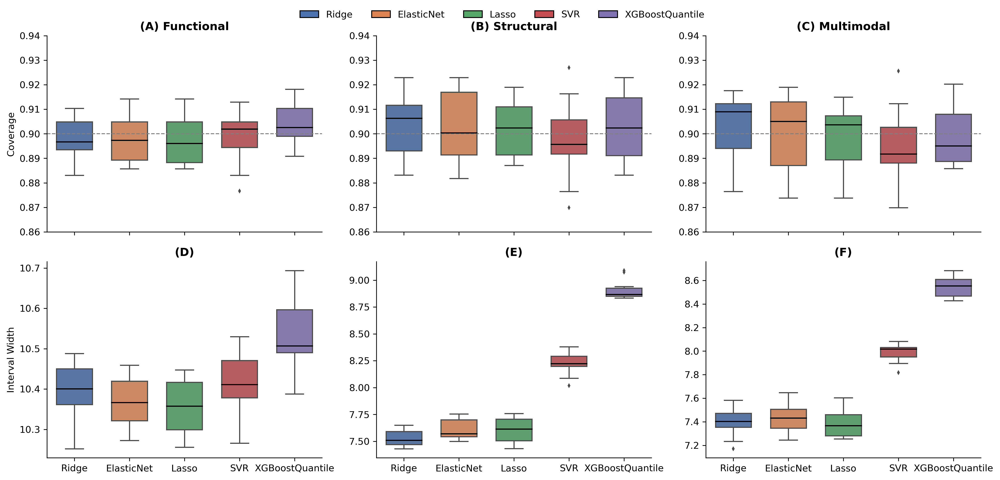

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import joblib

# Load results (in case not in memory)
all_records = joblib.load("saved_models/multiseed_all_datasets_10splits.pkl")
df_plot = pd.DataFrame(all_records)

model_order   = ["Ridge", "ElasticNet", "Lasso", "SVR", "XGBoostQuantile"]
model_colors  = {
    "Ridge":            "#4C72B0",   # blue
    "ElasticNet":       "#DD8452",   # orange
    "Lasso":            "#55A868",   # green
    "SVR":              "#C44E52",   # red
    "XGBoostQuantile":  "#8172B3",   # purple (new)
}
dataset_order = ["Functional", "Structural", "Multimodal"]

fig, axes = plt.subplots(2, 3, figsize=(15, 7), dpi=300, sharex=True)

box_kws = dict(width=0.65, linewidth=1.2, fliersize=2.5,
               medianprops={"color": "black"})

# ---- Top row: Coverage ----
for j, ds in enumerate(dataset_order):
    ax = axes[0, j]
    sub = df_plot[df_plot["dataset"] == ds]
    sns.boxplot(data=sub, x="model", y="coverage",
                order=model_order,
                palette=[model_colors[m] for m in model_order],
                ax=ax, **box_kws)
    ax.axhline(0.90, color="gray", linestyle="--", linewidth=1)
    ax.set_title(f"({chr(65+j)}) {ds}", weight="bold", fontsize=12)
    ax.set_xlabel("")
    ax.set_ylabel("Coverage" if j == 0 else "")
    ax.set_ylim(0.86, 0.94)
    sns.despine(ax=ax)

# ---- Bottom row: Interval width ----
for j, ds in enumerate(dataset_order):
    ax = axes[1, j]
    sub = df_plot[df_plot["dataset"] == ds]
    sns.boxplot(data=sub, x="model", y="width",
                order=model_order,
                palette=[model_colors[m] for m in model_order],
                ax=ax, **box_kws)
    ax.set_title(f"({chr(68+j)})", weight="bold", fontsize=12)
    ax.set_xlabel("")
    ax.set_ylabel("Interval Width" if j == 0 else "")
    sns.despine(ax=ax)

# ---- Shared legend on top ----
handles = [plt.Rectangle((0, 0), 1, 1,
                         facecolor=model_colors[m], edgecolor="black")
           for m in model_order]
fig.legend(handles, model_order, loc="upper center",
           ncol=5, frameon=False, bbox_to_anchor=(0.5, 1.02), fontsize=10)

plt.tight_layout()
plt.savefig("figure_coverage_width_5models_10splits.png", dpi=300, bbox_inches="tight")
plt.show()